In [1]:
import pandas as pd
import numpy as np
import os
#import json
#import ast
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
tableau_movies_full = pd.read_csv('data_csv/more/final_data_movie.csv', index_col=0)
tableau_movies_full

,id,title,vote_average,vote_count,adult_False,adult_True,Drama,Comedy,Action,Documentary,...,dates_types_date inconnue,dates_types_films anciens,dates_types_films récents,dates_types_films très récents,original_language_de,original_language_en,original_language_fr,original_language_it,original_language_ja,original_language_other
0,862,ToyStory,7.7,5415,1,0,0,1,0,0,...,0,0,1,0,0,1,0,0,0,0
1,8844,Jumanji,6.9,2413,1,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
2,15602,GrumpierOldMen,6.5,92,1,0,0,1,0,0,...,0,0,1,0,0,1,0,0,0,0
3,31357,WaitingtoExhale,6.1,34,1,0,1,1,0,0,...,0,0,1,0,0,1,0,0,0,0
4,11862,FatheroftheBridePartII,5.7,173,1,0,0,1,0,0,...,0,0,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44949,439050,Subdue,4.0,1,1,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,1
44950,111109,CenturyofBirthing,9.0,3,1,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,1
44951,67758,Betrayal,3.8,6,1,0,1,0,1,0,...,0,0,1,0,0,1,0,0,0,0
44952,227506,SatanTriumphant,0.0,0,1,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0


In [13]:
tableau_movies_full['title']

0                      ToyStory
1                       Jumanji
2                GrumpierOldMen
3               WaitingtoExhale
4        FatheroftheBridePartII
                  ...          
44949                    Subdue
44950         CenturyofBirthing
44951                  Betrayal
44952           SatanTriumphant
44953                  Queerama
Name: title, Length: 44954, dtype: object

In [3]:
tableau_movies = tableau_movies_full.drop(tableau_movies_full[['id', 'title']], axis = 1)
tableau_movies

,vote_average,vote_count,adult_False,adult_True,Drama,Comedy,Action,Documentary,Horror,Crime,...,dates_types_date inconnue,dates_types_films anciens,dates_types_films récents,dates_types_films très récents,original_language_de,original_language_en,original_language_fr,original_language_it,original_language_ja,original_language_other
0,7.7,5415,1,0,0,1,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
1,6.9,2413,1,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
2,6.5,92,1,0,0,1,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
3,6.1,34,1,0,1,1,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
4,5.7,173,1,0,0,1,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44949,4.0,1,1,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
44950,9.0,3,1,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
44951,3.8,6,1,0,1,0,1,0,0,0,...,0,0,1,0,0,1,0,0,0,0
44952,0.0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0


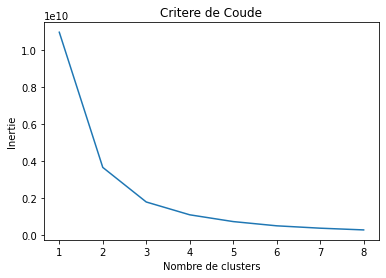

In [4]:
Inertie =[]
n_centroids = 9
for i in range(1, n_centroids):
    kmeans = KMeans(n_clusters = i).fit(tableau_movies)
    #kmeans.fit(x)
    Inertie.append(kmeans.inertia_)
import matplotlib.pyplot as plt
plt.plot(range(1, n_centroids), Inertie)
plt.title('Critere de Coude')
plt.xlabel('Nombre de clusters')
plt.ylabel('Inertie')
plt.show()

In [5]:
kmeans = KMeans(n_clusters=5).fit(tableau_movies)
centroids = kmeans.cluster_centers_

In [10]:
movies = pd.DataFrame({'id': tableau_movies_full['id'], 'Kmeans_movies_cluster': kmeans.labels_})
movies

,id,Kmeans_movies_cluster
0,862,4
1,8844,1
2,15602,0
3,31357,0
4,11862,0
...,...,...
44949,439050,0
44950,111109,0
44951,67758,0
44952,227506,0


In [8]:
movies['id'] = movies['id'].apply(lambda x : int(x))
movies['id']

0           862
1          8844
2         15602
3         31357
4         11862
          ...  
44949    439050
44950    111109
44951     67758
44952    227506
44953    461257
Name: id, Length: 44954, dtype: int64

In [12]:
import plotly.express as px

fig = px.histogram(movies, x="Kmeans_movies_cluster", title = "Repartition des films par cluster movies")
fig.update_xaxes(type='category')
fig.show()

In [18]:
link_user_votes = "data_csv/more/votecounts.csv"
# il existe des utilisateurs qui ont voté pour jusqu'à 18 000 films. On souhaite les tronquer
trunc_high = 400
trunc_low = 20

data_user_votes = pd.read_csv(link_user_votes)
data_user_votes = data_user_votes[ trunc_low < data_user_votes['voteCount'] ]
data_user_votes = data_user_votes[  data_user_votes['voteCount'] < trunc_high]
df = data_user_votes.sort_values(by=['voteCount'])
fig = px.scatter(x=pd.Series(range(0,len(df['userId']))), y=df['voteCount'])
fig.show()

In [20]:
link_ratings = "data_csv/ratings.csv"
ratings = pd.read_csv(link_ratings)

ratings = ratings[np.isin(ratings['userId'], data_user_votes['userId'])] #on filtre les utilisateurs qui ont emis trop de votes
ratings

,userId,movieId,rating,timestamp
0,1,110,1.0,1425941529
1,1,147,4.5,1425942435
2,1,858,5.0,1425941523
3,1,1221,5.0,1425941546
4,1,1246,5.0,1425941556
...,...,...,...,...
26024284,270896,58559,5.0,1257031564
26024285,270896,60069,5.0,1257032032
26024286,270896,63082,4.5,1257031764
26024287,270896,64957,4.5,1257033990


In [21]:
users = ratings.groupby('userId').groups
users

{1: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26], 2: [27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48], 4: [59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120], 5: [121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146], 7: [151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203], 8: [204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 

In [22]:
df_maxrating = pd.DataFrame(columns = ['userId', 'max_rating'])
df_maxrating.loc[0] = [max(ratings.iloc[users[1]]['userId']), max(ratings.iloc[users[1]]['rating']) ]
df_maxrating

,userId,max_rating
0,1.0,5.0


In [23]:
df_maxrating = pd.DataFrame(columns = ['userId', 'max_rating'])
for i in users:
    df_maxrating.loc[i-1] = [max(ratings.iloc[users[i]]['userId']), max(ratings.iloc[users[i]]['rating']) ]
    print(i)

df_maxrating  

1
2
4
5
7
8
9
11
12
15
16
17
20
21
22
25
27
28
29
30
32
33
34
35
37
38
40
41
43
47
48
49
51
53
54
55
56
58
59
60
63
64
65
67
68
69
71
73
74
75
76
77
79
80
81
82
83
84
89
91
93
94
95
96
97
98
101
102
103
104
105
106
107
111
112
114
115
116
117
119
123
125
126
127
129
131
133
134
136
138
139
141
142
146
147
148
151
153
155
157
158
160
161
162
164
166
170
173
174
176
178
179
181
186
187
188
191
192
193
196
198
200
201
209
211
212
213
215
217
218
222
223
224
225
227
228
230
232
233
234
235
236
242
245
246
247
248
249
250
252
253
255
256
261
265
266
267
269
273
277
279
280
284
289
294
295
296
298
303
306
308
312
313
314
316
317
318
319
320
321
322
323
324
325
329
330
331
334
335
337
338
341
342
343
344
348
349
350
352
353
354
360
361
363
365
366
370
371
376
377
380
382
384
386
387
388
389
391
400
404
408
410
411
412
414
415
416
417
418
419
420
421
423
425
426
427
430
431
432
433
435
439
442
443
445
447
450
451
452
454
455
456
457
458
459
461
463
469
471
474
475
477
479
480
481
487
488
490
4

3240
3243
3244
3245
3247
3249
3252
3254
3256
3257
3258
3259
3261
3262
3265
3266
3267
3271
3272
3273
3274
3277
3278
3280
3281
3282
3283
3285
3288
3290
3291
3292
3293
3294
3295
3300
3301
3302
3304
3305
3309
3310
3311
3312
3313
3314
3315
3317
3318
3319
3322
3323
3324
3325
3327
3329
3330
3332
3333
3336
3338
3339
3340
3341
3342
3343
3344
3345
3349
3354
3358
3359
3360
3361
3362
3364
3365
3366
3367
3369
3371
3374
3376
3380
3382
3383
3385
3386
3388
3389
3391
3395
3397
3398
3399
3403
3405
3406
3408
3409
3412
3413
3415
3417
3422
3423
3425
3428
3431
3432
3433
3434
3436
3438
3439
3440
3441
3442
3443
3444
3446
3448
3449
3450
3451
3453
3456
3457
3458
3460
3461
3462
3463
3464
3466
3467
3468
3469
3471
3473
3475
3477
3478
3479
3481
3482
3485
3487
3488
3491
3493
3495
3497
3498
3499
3500
3503
3506
3507
3510
3511
3515
3518
3522
3526
3527
3529
3533
3534
3535
3536
3537
3540
3541
3543
3545
3547
3548
3551
3552
3555
3556
3558
3560
3563
3566
3567
3570
3572
3573
3575
3577
3578
3579
3581
3582
3584
3585
3589
3591


6140
6141
6143
6148
6149
6151
6152
6153
6154
6156
6157
6158
6159
6161
6162
6164
6167
6169
6170
6172
6175
6176
6177
6178
6179
6181
6182
6185
6187
6190
6191
6192
6193
6194
6196
6197
6200
6202
6207
6209
6210
6211
6214
6215
6220
6225
6227
6232
6234
6236
6237
6238
6240
6243
6244
6248
6252
6253
6255
6258
6259
6260
6263
6264
6269
6272
6273
6280
6281
6283
6284
6285
6286
6287
6288
6289
6290
6292
6293
6297
6298
6300
6303
6304
6305
6306
6307
6308
6313
6314
6316
6317
6319
6320
6323
6325
6326
6327
6332
6333
6334
6335
6336
6337
6340
6342
6343
6346
6347
6348
6351
6352
6353
6354
6355
6356
6358
6359
6360
6361
6362
6363
6364
6365
6368
6369
6371
6372
6374
6376
6377
6379
6382
6384
6386
6387
6389
6390
6391
6392
6394
6396
6402
6404
6406
6407
6408
6409
6410
6412
6415
6416
6417
6418
6420
6422
6424
6425
6426
6427
6428
6429
6430
6431
6433
6434
6436
6440
6442
6443
6444
6449
6451
6455
6456
6460
6462
6463
6464
6466
6467
6469
6471
6472
6473
6475
6477
6478
6481
6482
6483
6485
6486
6489
6490
6492
6495
6496
6497
6504


9281
9284
9285
9286
9288
9289
9290
9291
9294
9295
9296
9297
9298
9299
9300
9301
9302
9304
9305
9306
9307
9308
9309
9310
9311
9314
9315
9316
9319
9321
9322
9331
9332
9337
9339
9340
9342
9344
9345
9346
9347
9350
9351
9352
9354
9355
9356
9357
9358
9360
9361
9367
9368
9369
9371
9372
9373
9375
9378
9379
9380
9381
9383
9384
9385
9387
9388
9389
9390
9392
9393
9396
9397
9398
9400
9401
9404
9405
9409
9410
9411
9413
9416
9417
9418
9419
9420
9422
9423
9424
9425
9426
9427
9428
9429
9430
9431
9432
9433
9436
9443
9444
9445
9447
9448
9449
9451
9453
9455
9456
9457
9459
9462
9464
9469
9470
9471
9473
9475
9479
9481
9483
9485
9487
9491
9494
9497
9498
9499
9500
9504
9505
9506
9507
9508
9510
9514
9516
9518
9521
9523
9524
9526
9527
9528
9529
9530
9531
9532
9534
9538
9542
9543
9544
9545
9548
9549
9551
9553
9554
9559
9561
9564
9565
9566
9568
9572
9573
9574
9576
9578
9580
9582
9583
9584
9586
9587
9588
9593
9594
9602
9608
9609
9610
9613
9614
9615
9616
9618
9619
9620
9621
9622
9623
9624
9625
9626
9633
9634
9635


12040
12042
12043
12046
12047
12048
12050
12053
12054
12056
12057
12059
12060
12061
12063
12065
12068
12069
12070
12074
12075
12076
12078
12079
12082
12083
12084
12085
12086
12087
12089
12090
12096
12097
12099
12100
12106
12107
12110
12113
12114
12118
12119
12121
12122
12124
12129
12133
12134
12136
12137
12138
12139
12143
12146
12147
12148
12149
12150
12151
12153
12156
12163
12165
12166
12167
12168
12169
12171
12173
12174
12175
12178
12179
12181
12182
12183
12184
12185
12190
12191
12194
12197
12199
12200
12201
12202
12204
12210
12211
12213
12215
12216
12217
12218
12220
12221
12223
12226
12228
12230
12233
12234
12235
12236
12237
12238
12242
12244
12245
12246
12247
12248
12249
12251
12253
12255
12259
12260
12262
12263
12264
12265
12266
12267
12269
12270
12275
12276
12278
12279
12281
12282
12284
12286
12287
12288
12289
12291
12292
12294
12296
12297
12299
12303
12304
12305
12306
12307
12309
12310
12314
12317
12318
12319
12320
12322
12323
12326
12328
12330
12331
12334
12336
12337
12339
1234

14528
14529
14531
14532
14533
14534
14536
14538
14539
14540
14541
14543
14547
14548
14549
14551
14554
14556
14558
14560
14561
14562
14564
14565
14566
14568
14569
14571
14572
14573
14576
14578
14579
14580
14581
14582
14584
14585
14586
14587
14588
14589
14590
14593
14594
14597
14598
14599
14602
14603
14604
14606
14608
14609
14611
14612
14613
14615
14616
14618
14620
14622
14624
14628
14629
14630
14631
14632
14633
14635
14637
14640
14643
14645
14646
14647
14648
14649
14650
14651
14652
14653
14656
14657
14659
14661
14662
14663
14664
14665
14669
14672
14673
14674
14676
14681
14683
14684
14686
14687
14688
14691
14693
14694
14697
14698
14699
14700
14701
14703
14704
14706
14708
14709
14711
14714
14719
14720
14721
14727
14728
14730
14731
14732
14733
14736
14737
14738
14739
14740
14742
14743
14744
14746
14747
14749
14751
14755
14756
14758
14759
14760
14761
14764
14767
14768
14769
14770
14771
14772
14773
14775
14776
14778
14780
14781
14782
14783
14784
14785
14786
14789
14790
14792
14793
14798
1480

17001
17003
17004
17011
17012
17014
17018
17019
17021
17022
17023
17024
17026
17027
17028
17029
17032
17033
17034
17036
17039
17040
17042
17045
17050
17051
17053
17054
17055
17056
17057
17060
17062
17064
17065
17066
17068
17069
17071
17074
17075
17078
17079
17080
17083
17084
17085
17087
17088
17089
17093
17094
17095
17096
17097
17098
17099
17100
17102
17103
17105
17106
17108
17109
17111
17112
17113
17114
17115
17116
17117
17118
17121
17122
17123
17124
17126
17127
17128
17129
17131
17132
17133
17134
17135
17136
17140
17144
17146
17148
17152
17153
17156
17157
17159
17160
17162
17163
17165
17166
17167
17168
17170
17172
17173
17176
17178
17181
17182
17183
17185
17186
17195
17196
17197
17199
17200
17201
17203
17204
17206
17208
17215
17216
17217
17218
17221
17223
17226
17227
17228
17229
17230
17231
17232
17233
17234
17236
17237
17239
17240
17242
17244
17252
17254
17255
17256
17260
17261
17262
17263
17264
17267
17268
17270
17271
17274
17276
17277
17281
17282
17284
17289
17290
17291
17292
1729

19533
19535
19538
19540
19541
19545
19546
19548
19549
19551
19552
19554
19555
19559
19562
19571
19572
19573
19574
19575
19576
19578
19582
19583
19584
19585
19586
19588
19589
19590
19591
19596
19600
19604
19605
19607
19608
19609
19611
19614
19615
19616
19619
19620
19621
19622
19623
19626
19627
19629
19633
19634
19639
19640
19641
19642
19643
19644
19645
19646
19650
19652
19653
19655
19657
19658
19659
19662
19663
19664
19665
19666
19668
19669
19671
19673
19675
19681
19682
19683
19685
19687
19688
19693
19695
19696
19697
19698
19699
19700
19702
19703
19707
19709
19710
19711
19713
19714
19720
19722
19723
19724
19725
19728
19729
19734
19735
19736
19737
19738
19739
19744
19745
19748
19751
19752
19754
19755
19756
19757
19758
19759
19761
19762
19763
19764
19765
19766
19769
19772
19775
19776
19777
19780
19781
19783
19784
19785
19788
19790
19791
19793
19794
19796
19797
19799
19801
19802
19803
19805
19811
19813
19814
19817
19822
19824
19825
19828
19829
19830
19831
19833
19835
19837
19841
19842
1984

22141
22142
22143
22146
22149
22150
22152
22153
22154
22155
22158
22161
22164
22167
22168
22169
22177
22178
22179
22181
22182
22184
22186
22187
22188
22191
22193
22195
22199
22200
22201
22203
22206
22207
22210
22211
22212
22214
22215
22216
22217
22220
22222
22227
22231
22233
22234
22236
22241
22242
22243
22244
22245
22247
22248
22250
22251
22253
22255
22257
22259
22260
22261
22263
22264
22265
22267
22269
22270
22272
22276
22278
22280
22282
22283
22286
22288
22292
22294
22296
22297
22299
22303
22306
22307
22308
22310
22312
22314
22318
22320
22323
22325
22326
22327
22329
22330
22331
22332
22333
22334
22335
22337
22338
22340
22341
22344
22345
22346
22347
22348
22349
22350
22352
22353
22354
22355
22356
22357
22358
22359
22360
22362
22366
22367
22368
22369
22370
22371
22373
22374
22376
22377
22378
22382
22385
22386
22390
22392
22393
22396
22397
22400
22401
22402
22403
22405
22406
22408
22409
22410
22411
22412
22413
22415
22416
22418
22419
22420
22422
22423
22425
22426
22427
22429
22431
2243

24725
24726
24728
24730
24735
24736
24738
24739
24741
24742
24744
24746
24749
24751
24752
24753
24755
24756
24757
24759
24762
24763
24764
24765
24766
24767
24770
24771
24772
24774
24775
24776
24777
24778
24779
24781
24782
24784
24787
24788
24791
24794
24795
24796
24798
24799
24800
24804
24808
24809
24814
24816
24817
24821
24823
24827
24830
24834
24835
24838
24840
24843
24844
24845
24847
24851
24852
24856
24857
24858
24860
24865
24868
24869
24870
24871
24872
24873
24874
24876
24877
24880
24883
24884
24886
24887
24889
24890
24892
24893
24897
24898
24901
24903
24904
24906
24907
24911
24912
24917
24918
24920
24922
24924
24926
24928
24932
24933
24934
24937
24939
24942
24946
24947
24948
24952
24953
24955
24958
24961
24962
24963
24964
24966
24970
24973
24975
24976
24980
24981
24983
24985
24987
24989
24991
24992
24993
24994
24995
24996
24998
24999
25007
25008
25009
25010
25011
25012
25015
25016
25017
25018
25023
25025
25026
25027
25030
25033
25039
25042
25044
25050
25051
25052
25053
25056
2505

27277
27280
27281
27285
27287
27288
27290
27291
27293
27294
27295
27296
27297
27298
27300
27302
27303
27304
27307
27309
27310
27313
27315
27316
27318
27321
27322
27323
27324
27325
27326
27327
27329
27330
27332
27333
27334
27335
27339
27340
27342
27343
27344
27346
27347
27349
27351
27354
27355
27357
27358
27361
27362
27363
27368
27369
27371
27372
27373
27376
27378
27381
27384
27385
27386
27392
27393
27394
27395
27398
27399
27400
27403
27404
27406
27407
27408
27410
27411
27412
27413
27415
27419
27421
27422
27423
27424
27426
27428
27429
27431
27432
27433
27436
27437
27441
27446
27447
27448
27449
27451
27454
27455
27456
27458
27461
27463
27465
27466
27468
27469
27470
27478
27479
27480
27482
27484
27486
27487
27488
27489
27490
27491
27492
27495
27496
27499
27500
27501
27502
27506
27508
27509
27511
27512
27513
27517
27518
27519
27521
27522
27524
27526
27530
27531
27534
27535
27536
27538
27539
27541
27542
27543
27544
27545
27546
27549
27550
27551
27552
27553
27554
27555
27557
27558
27559
2756

29895
29897
29898
29899
29902
29903
29905
29906
29908
29910
29914
29915
29917
29922
29924
29925
29930
29931
29932
29935
29936
29937
29938
29940
29941
29942
29946
29947
29949
29950
29954
29955
29956
29957
29960
29961
29962
29964
29965
29969
29971
29973
29974
29975
29976
29978
29980
29983
29984
29986
29987
29988
29989
29991
29992
29993
29994
29997
29998
30000
30001
30003
30004
30006
30007
30009
30010
30011
30012
30013
30014
30017
30019
30020
30021
30022
30024
30028
30030
30031
30035
30040
30041
30043
30044
30045
30048
30049
30051
30054
30055
30057
30058
30064
30065
30069
30070
30071
30072
30073
30076
30077
30078
30080
30081
30082
30084
30086
30088
30090
30091
30092
30093
30096
30097
30099
30103
30104
30105
30108
30112
30114
30118
30121
30123
30124
30125
30127
30129
30130
30131
30132
30134
30136
30137
30139
30148
30150
30151
30156
30157
30158
30159
30160
30161
30163
30164
30166
30167
30168
30170
30171
30173
30175
30176
30177
30178
30180
30181
30184
30185
30186
30187
30190
30192
30195
3019

32636
32637
32638
32640
32641
32643
32645
32650
32652
32653
32654
32655
32658
32659
32661
32664
32665
32669
32670
32672
32674
32675
32676
32681
32682
32683
32684
32686
32691
32696
32697
32698
32699
32700
32701
32702
32703
32704
32707
32709
32712
32714
32721
32724
32725
32729
32730
32736
32738
32739
32740
32741
32742
32743
32744
32745
32747
32749
32752
32754
32755
32758
32762
32764
32765
32769
32770
32771
32772
32774
32776
32777
32779
32781
32782
32783
32784
32785
32787
32789
32791
32794
32795
32796
32798
32799
32803
32804
32805
32806
32809
32811
32813
32814
32815
32818
32822
32823
32826
32828
32829
32830
32832
32834
32835
32837
32838
32840
32841
32842
32843
32844
32845
32847
32849
32854
32855
32858
32859
32860
32861
32863
32864
32866
32868
32869
32872
32874
32875
32879
32882
32883
32884
32885
32887
32888
32891
32892
32894
32896
32904
32905
32906
32907
32911
32916
32917
32918
32919
32920
32922
32923
32925
32926
32927
32930
32932
32934
32935
32936
32937
32938
32940
32941
32942
32945
3294

35231
35234
35238
35240
35244
35245
35246
35247
35248
35251
35253
35254
35256
35261
35263
35264
35270
35271
35272
35273
35275
35276
35278
35286
35288
35291
35295
35296
35297
35299
35300
35302
35305
35308
35311
35312
35313
35314
35317
35318
35322
35324
35325
35328
35329
35330
35332
35334
35335
35336
35337
35341
35344
35345
35346
35348
35349
35351
35354
35358
35359
35364
35367
35369
35370
35371
35374
35375
35377
35380
35381
35382
35384
35386
35387
35389
35391
35392
35393
35394
35395
35396
35397
35399
35400
35401
35402
35403
35404
35405
35408
35409
35410
35412
35416
35418
35423
35425
35427
35428
35431
35435
35436
35437
35440
35444
35445
35446
35447
35448
35449
35450
35455
35456
35457
35458
35461
35468
35470
35472
35473
35474
35477
35478
35479
35480
35483
35484
35485
35487
35489
35490
35492
35493
35494
35495
35497
35498
35499
35501
35503
35504
35510
35512
35514
35515
35516
35521
35523
35524
35525
35531
35532
35533
35535
35536
35537
35539
35540
35543
35546
35547
35548
35549
35550
35552
3555

37823
37824
37825
37826
37829
37831
37834
37840
37841
37842
37843
37845
37847
37849
37850
37851
37854
37855
37856
37857
37858
37861
37863
37867
37869
37872
37874
37875
37877
37878
37880
37882
37883
37885
37886
37888
37889
37890
37891
37892
37893
37894
37895
37896
37897
37898
37899
37900
37901
37902
37904
37905
37906
37908
37911
37914
37915
37916
37918
37919
37920
37921
37922
37923
37924
37925
37927
37931
37932
37933
37935
37936
37937
37938
37939
37940
37944
37945
37947
37948
37950
37953
37957
37959
37960
37961
37962
37963
37970
37971
37977
37978
37979
37980
37985
37990
37992
37993
37996
37997
37998
37999
38003
38004
38005
38006
38009
38011
38012
38015
38016
38018
38024
38025
38029
38030
38031
38033
38034
38035
38036
38037
38038
38039
38041
38042
38044
38045
38047
38048
38049
38053
38054
38059
38061
38063
38066
38067
38068
38069
38070
38073
38074
38076
38077
38078
38080
38082
38084
38085
38087
38089
38091
38093
38094
38095
38099
38100
38101
38103
38106
38107
38108
38110
38113
38117
3812

40277
40278
40279
40283
40284
40285
40287
40288
40290
40291
40292
40294
40295
40296
40298
40299
40300
40303
40304
40306
40307
40308
40309
40310
40311
40321
40322
40323
40324
40326
40327
40328
40329
40330
40332
40333
40334
40338
40340
40341
40346
40347
40348
40349
40350
40351
40352
40353
40355
40356
40358
40359
40361
40362
40365
40366
40367
40368
40369
40370
40373
40374
40375
40378
40379
40381
40382
40383
40384
40385
40386
40390
40392
40395
40399
40400
40401
40403
40404
40406
40408
40411
40412
40414
40417
40419
40420
40421
40423
40425
40428
40431
40432
40434
40437
40439
40440
40442
40445
40446
40449
40450
40451
40453
40455
40457
40458
40460
40461
40462
40463
40466
40468
40474
40477
40479
40480
40482
40486
40488
40491
40494
40495
40496
40497
40498
40500
40503
40507
40508
40509
40510
40511
40513
40518
40520
40525
40528
40530
40535
40536
40538
40539
40540
40542
40543
40545
40548
40550
40551
40554
40560
40562
40565
40566
40567
40568
40569
40574
40575
40584
40585
40586
40590
40591
40592
4059

42851
42852
42853
42854
42855
42856
42858
42862
42864
42865
42866
42867
42872
42873
42874
42876
42877
42879
42881
42882
42883
42884
42886
42887
42888
42889
42891
42892
42893
42895
42896
42899
42901
42902
42905
42906
42908
42913
42919
42920
42922
42924
42927
42929
42930
42932
42933
42934
42935
42936
42937
42939
42940
42941
42943
42944
42945
42946
42947
42949
42950
42951
42952
42955
42956
42958
42959
42961
42963
42965
42966
42972
42973
42974
42975
42977
42978
42979
42980
42981
42982
42985
42990
42995
42996
42997
42998
43001
43003
43004
43008
43009
43010
43011
43012
43016
43020
43021
43023
43030
43031
43034
43035
43036
43040
43043
43045
43047
43051
43054
43055
43057
43058
43060
43061
43062
43064
43066
43068
43069
43070
43071
43072
43073
43075
43076
43077
43078
43079
43080
43081
43084
43086
43087
43090
43091
43096
43098
43101
43102
43103
43104
43105
43106
43110
43112
43113
43115
43116
43117
43120
43121
43122
43123
43124
43126
43128
43130
43131
43134
43135
43138
43139
43142
43144
43149
4315

45441
45442
45443
45444
45445
45446
45448
45455
45457
45458
45460
45461
45462
45463
45465
45466
45467
45470
45471
45472
45473
45474
45478
45480
45482
45483
45486
45489
45490
45491
45493
45499
45500
45501
45502
45503
45504
45505
45507
45509
45512
45514
45515
45517
45521
45524
45527
45528
45530
45531
45532
45533
45534
45536
45537
45539
45540
45541
45542
45545
45547
45548
45553
45554
45555
45556
45557
45559
45560
45561
45562
45563
45564
45565
45567
45568
45573
45575
45579
45580
45582
45584
45585
45586
45587
45588
45592
45594
45595
45596
45600
45601
45602
45603
45608
45609
45610
45611
45613
45616
45618
45620
45621
45623
45624
45626
45627
45628
45629
45632
45634
45636
45637
45638
45639
45641
45643
45644
45648
45649
45650
45652
45653
45654
45656
45657
45659
45662
45663
45664
45666
45670
45671
45672
45673
45674
45675
45678
45679
45680
45681
45683
45684
45688
45689
45690
45696
45697
45698
45702
45703
45704
45708
45716
45718
45719
45722
45724
45725
45726
45728
45731
45736
45738
45739
45740
4574

47984
47986
47993
47994
47996
47998
47999
48001
48004
48006
48008
48009
48010
48013
48014
48015
48016
48018
48019
48020
48022
48023
48024
48027
48028
48031
48033
48036
48039
48044
48045
48046
48047
48050
48052
48053
48054
48057
48058
48059
48062
48065
48067
48070
48074
48076
48078
48080
48082
48085
48086
48089
48092
48093
48094
48095
48096
48097
48098
48099
48100
48101
48102
48104
48105
48106
48107
48108
48109
48111
48112
48114
48116
48118
48119
48125
48126
48130
48131
48134
48135
48138
48139
48142
48144
48145
48146
48147
48148
48151
48154
48157
48159
48163
48165
48168
48169
48171
48172
48174
48175
48176
48177
48180
48181
48186
48187
48188
48190
48192
48193
48194
48195
48196
48197
48200
48201
48204
48205
48206
48208
48210
48211
48212
48215
48216
48218
48219
48220
48221
48222
48225
48227
48229
48231
48232
48233
48234
48235
48238
48239
48241
48242
48243
48244
48249
48253
48255
48256
48257
48259
48262
48263
48264
48265
48266
48267
48268
48269
48270
48273
48277
48278
48279
48280
48282
4828

50519
50524
50525
50527
50533
50534
50535
50537
50538
50543
50544
50549
50550
50552
50553
50554
50558
50560
50562
50565
50566
50567
50568
50573
50575
50577
50579
50580
50588
50590
50591
50593
50594
50595
50597
50598
50599
50600
50601
50602
50604
50605
50608
50610
50612
50615
50624
50625
50630
50631
50633
50634
50635
50636
50638
50640
50641
50643
50646
50647
50648
50649
50657
50660
50661
50662
50663
50664
50665
50666
50667
50668
50669
50670
50672
50673
50674
50676
50678
50679
50680
50681
50682
50683
50685
50687
50688
50690
50692
50694
50695
50696
50697
50698
50701
50703
50705
50706
50707
50709
50710
50712
50713
50714
50715
50716
50717
50719
50720
50721
50722
50724
50725
50728
50729
50731
50732
50734
50737
50738
50742
50743
50744
50746
50747
50752
50753
50755
50756
50757
50760
50761
50763
50764
50768
50769
50774
50776
50777
50779
50780
50782
50784
50786
50787
50788
50789
50790
50791
50792
50793
50796
50797
50799
50801
50806
50809
50810
50811
50815
50820
50823
50826
50827
50828
50831
5083

53120
53122
53123
53124
53125
53132
53134
53135
53136
53138
53140
53142
53143
53144
53145
53147
53151
53152
53154
53159
53160
53161
53163
53168
53170
53173
53175
53176
53177
53178
53179
53180
53181
53183
53184
53185
53187
53188
53189
53190
53191
53192
53194
53195
53199
53201
53203
53204
53206
53207
53208
53209
53214
53215
53217
53222
53223
53225
53229
53230
53231
53232
53235
53238
53239
53240
53241
53242
53243
53244
53245
53246
53247
53249
53252
53253
53256
53257
53258
53260
53261
53262
53264
53265
53266
53268
53269
53275
53276
53278
53280
53282
53283
53285
53286
53288
53290
53291
53293
53294
53295
53298
53299
53300
53301
53302
53307
53308
53310
53311
53312
53313
53314
53315
53316
53317
53319
53320
53321
53325
53326
53328
53333
53334
53337
53340
53341
53343
53344
53345
53346
53347
53349
53351
53352
53354
53355
53357
53358
53359
53360
53362
53364
53365
53366
53368
53370
53374
53375
53376
53377
53380
53382
53383
53385
53387
53389
53390
53392
53395
53400
53401
53402
53403
53404
53405
5340

55618
55619
55623
55624
55626
55628
55629
55631
55633
55634
55637
55639
55642
55643
55644
55646
55648
55649
55650
55651
55653
55654
55658
55659
55661
55662
55667
55668
55669
55670
55671
55676
55677
55678
55679
55680
55681
55682
55683
55684
55688
55689
55690
55692
55698
55699
55701
55707
55710
55712
55713
55714
55717
55718
55720
55721
55722
55726
55728
55733
55735
55737
55741
55746
55747
55752
55755
55757
55759
55761
55762
55764
55765
55767
55768
55769
55770
55771
55772
55773
55774
55775
55777
55778
55781
55785
55786
55788
55789
55792
55794
55796
55799
55801
55802
55803
55806
55809
55810
55812
55813
55814
55816
55819
55820
55822
55823
55824
55826
55827
55829
55830
55831
55833
55834
55835
55837
55839
55840
55842
55843
55844
55845
55850
55852
55854
55860
55861
55865
55867
55868
55869
55871
55872
55875
55877
55878
55879
55880
55882
55885
55889
55890
55891
55893
55894
55896
55897
55901
55902
55903
55909
55910
55912
55913
55915
55920
55922
55923
55924
55925
55927
55930
55931
55932
55934
5593

58125
58126
58128
58130
58131
58132
58133
58136
58137
58138
58140
58141
58142
58143
58144
58146
58147
58148
58150
58151
58152
58153
58154
58157
58161
58163
58167
58168
58169
58170
58172
58173
58174
58177
58182
58183
58187
58188
58189
58190
58192
58193
58194
58196
58197
58198
58199
58201
58206
58208
58211
58213
58214
58216
58220
58223
58224
58225
58227
58228
58229
58230
58232
58233
58234
58235
58237
58238
58240
58241
58242
58244
58248
58249
58250
58251
58252
58253
58254
58255
58256
58257
58258
58264
58265
58266
58269
58272
58275
58280
58284
58285
58286
58287
58288
58289
58291
58295
58296
58297
58298
58299
58300
58301
58302
58304
58307
58308
58310
58311
58313
58317
58318
58320
58322
58326
58328
58332
58333
58335
58338
58339
58340
58341
58342
58343
58344
58345
58346
58347
58349
58351
58354
58355
58357
58360
58362
58363
58365
58366
58370
58376
58379
58381
58383
58384
58385
58386
58388
58392
58394
58396
58397
58398
58399
58401
58402
58403
58404
58409
58410
58412
58416
58418
58419
58422
5842

60579
60580
60581
60582
60584
60585
60586
60587
60590
60595
60596
60597
60598
60599
60600
60601
60602
60603
60606
60609
60611
60613
60614
60615
60617
60619
60620
60622
60625
60627
60630
60631
60633
60634
60636
60637
60638
60640
60641
60642
60643
60644
60645
60646
60648
60652
60653
60655
60660
60663
60665
60667
60676
60677
60678
60679
60680
60681
60682
60683
60684
60685
60693
60695
60699
60700
60701
60703
60704
60705
60708
60710
60713
60718
60720
60721
60723
60725
60728
60731
60732
60735
60738
60739
60741
60744
60745
60746
60748
60749
60753
60754
60755
60756
60758
60759
60760
60763
60764
60767
60770
60771
60774
60776
60778
60779
60781
60784
60790
60792
60794
60795
60800
60802
60803
60804
60805
60806
60807
60808
60811
60813
60814
60815
60816
60820
60821
60822
60824
60825
60826
60828
60829
60832
60833
60836
60838
60839
60840
60841
60842
60843
60847
60849
60850
60851
60856
60858
60859
60863
60865
60866
60868
60869
60871
60874
60875
60877
60878
60880
60882
60883
60885
60886
60887
60888
6088

63083
63084
63086
63088
63091
63095
63096
63098
63099
63103
63105
63108
63109
63110
63111
63113
63115
63117
63118
63120
63122
63123
63124
63128
63130
63133
63134
63136
63140
63141
63142
63145
63147
63151
63154
63155
63158
63159
63160
63164
63165
63167
63169
63170
63171
63172
63173
63174
63176
63181
63182
63184
63185
63186
63189
63190
63191
63195
63196
63201
63203
63204
63205
63206
63207
63209
63212
63214
63215
63216
63217
63218
63220
63224
63225
63229
63230
63231
63232
63234
63235
63237
63238
63239
63241
63242
63243
63244
63245
63246
63247
63248
63250
63251
63255
63257
63258
63259
63260
63262
63264
63266
63267
63269
63270
63271
63272
63274
63275
63277
63278
63279
63280
63282
63283
63285
63287
63288
63290
63291
63294
63296
63298
63300
63301
63305
63306
63308
63309
63310
63312
63313
63315
63316
63317
63318
63320
63322
63323
63324
63325
63327
63329
63330
63331
63332
63333
63335
63337
63338
63339
63342
63345
63346
63347
63348
63350
63351
63352
63356
63357
63358
63359
63360
63361
63362
6336

65653
65656
65657
65658
65659
65660
65662
65665
65669
65673
65675
65676
65678
65680
65682
65683
65686
65687
65688
65689
65690
65691
65692
65695
65697
65698
65699
65704
65709
65710
65712
65714
65717
65718
65719
65720
65721
65722
65723
65725
65726
65727
65728
65729
65730
65733
65734
65735
65736
65737
65740
65741
65742
65743
65744
65745
65746
65749
65750
65752
65753
65754
65755
65756
65757
65758
65762
65764
65765
65769
65771
65772
65773
65774
65775
65776
65777
65778
65780
65781
65782
65783
65784
65785
65787
65790
65794
65800
65804
65805
65806
65807
65808
65809
65812
65815
65818
65822
65823
65828
65831
65832
65833
65835
65836
65837
65838
65840
65841
65848
65849
65850
65851
65852
65853
65854
65855
65857
65859
65860
65862
65863
65864
65867
65872
65874
65877
65878
65881
65882
65883
65884
65885
65886
65888
65891
65892
65893
65894
65896
65897
65898
65899
65900
65901
65902
65903
65904
65909
65910
65911
65914
65915
65918
65919
65921
65927
65931
65932
65933
65938
65939
65943
65944
65945
65946
6594

68130
68135
68136
68137
68138
68139
68141
68142
68143
68144
68145
68146
68148
68149
68152
68154
68155
68157
68162
68166
68169
68170
68173
68174
68176
68177
68178
68181
68182
68183
68184
68186
68189
68190
68191
68193
68195
68197
68198
68200
68201
68204
68205
68211
68213
68215
68216
68218
68219
68221
68222
68226
68227
68228
68230
68233
68235
68236
68238
68239
68240
68241
68242
68244
68245
68248
68251
68252
68253
68254
68256
68258
68259
68260
68266
68267
68268
68271
68272
68275
68276
68278
68280
68281
68282
68283
68287
68290
68291
68292
68294
68295
68300
68301
68303
68304
68305
68308
68309
68311
68312
68313
68314
68316
68318
68319
68320
68322
68326
68329
68330
68331
68334
68336
68337
68338
68339
68342
68343
68346
68349
68350
68352
68353
68354
68355
68356
68358
68359
68360
68365
68366
68373
68374
68375
68376
68377
68381
68384
68385
68386
68387
68388
68389
68390
68392
68393
68394
68395
68396
68397
68398
68399
68403
68404
68405
68408
68409
68413
68415
68417
68418
68420
68421
68423
68424
6842

70725
70726
70727
70728
70729
70731
70734
70735
70737
70738
70740
70741
70743
70744
70745
70748
70750
70751
70753
70757
70758
70759
70761
70762
70763
70765
70767
70768
70771
70772
70773
70775
70777
70778
70781
70783
70784
70785
70787
70788
70789
70790
70792
70794
70795
70798
70799
70800
70802
70803
70804
70805
70811
70812
70813
70815
70816
70817
70819
70820
70823
70824
70827
70829
70830
70831
70832
70833
70835
70840
70841
70842
70843
70845
70847
70848
70851
70854
70855
70856
70857
70859
70861
70862
70868
70869
70870
70871
70874
70876
70877
70878
70879
70880
70881
70884
70887
70888
70892
70893
70896
70897
70898
70899
70900
70901
70903
70907
70908
70910
70911
70913
70917
70919
70920
70921
70925
70926
70927
70929
70932
70933
70937
70938
70939
70940
70942
70943
70945
70946
70947
70950
70951
70953
70954
70955
70956
70957
70965
70966
70968
70969
70970
70971
70972
70973
70975
70977
70979
70980
70982
70984
70987
70988
70989
70992
71002
71005
71007
71008
71009
71010
71012
71015
71016
71017
7101

73312
73313
73314
73316
73317
73318
73319
73320
73322
73324
73326
73327
73328
73332
73333
73334
73335
73336
73340
73342
73344
73345
73346
73347
73348
73349
73350
73352
73353
73354
73356
73358
73359
73361
73363
73365
73366
73367
73369
73370
73373
73375
73376
73377
73379
73382
73384
73388
73389
73390
73391
73393
73395
73397
73398
73399
73400
73401
73402
73404
73408
73409
73411
73412
73414
73417
73420
73421
73423
73424
73425
73429
73430
73431
73432
73433
73436
73438
73439
73441
73442
73443
73444
73445
73447
73448
73456
73457
73458
73459
73460
73463
73465
73466
73467
73468
73470
73471
73472
73473
73474
73479
73481
73483
73486
73487
73493
73494
73495
73501
73502
73504
73505
73508
73510
73512
73514
73515
73516
73518
73520
73522
73523
73526
73527
73530
73531
73532
73533
73536
73538
73542
73543
73544
73545
73546
73547
73548
73549
73550
73554
73555
73558
73559
73560
73561
73563
73564
73565
73566
73574
73575
73576
73577
73578
73579
73581
73582
73584
73586
73589
73592
73593
73594
73595
73599
7360

75862
75863
75864
75867
75869
75871
75872
75873
75879
75880
75881
75882
75884
75885
75888
75894
75899
75901
75905
75906
75907
75908
75910
75912
75915
75916
75917
75918
75919
75921
75922
75923
75924
75925
75926
75927
75928
75929
75930
75931
75932
75935
75936
75937
75938
75940
75941
75944
75947
75948
75949
75952
75955
75956
75957
75960
75963
75964
75966
75968
75970
75976
75978
75979
75983
75992
75993
75995
75997
75998
75999
76000
76001
76002
76005
76006
76007
76010
76011
76012
76013
76014
76015
76016
76020
76021
76027
76029
76030
76036
76037
76040
76042
76043
76044
76045
76048
76049
76051
76052
76056
76058
76059
76060
76064
76065
76068
76069
76070
76074
76075
76076
76078
76079
76080
76085
76086
76087
76088
76089
76093
76096
76097
76102
76107
76108
76111
76112
76113
76114
76116
76118
76119
76122
76126
76127
76128
76130
76131
76134
76135
76138
76142
76145
76147
76148
76151
76153
76157
76158
76161
76162
76163
76167
76169
76171
76172
76174
76179
76181
76183
76184
76186
76188
76189
76190
7619

78539
78540
78541
78543
78546
78550
78556
78558
78559
78560
78562
78563
78566
78567
78568
78569
78570
78571
78575
78576
78577
78578
78579
78580
78582
78583
78584
78585
78586
78588
78591
78592
78593
78594
78595
78596
78597
78598
78600
78601
78602
78603
78604
78605
78607
78608
78611
78612
78613
78616
78617
78620
78621
78622
78624
78626
78627
78628
78630
78631
78632
78633
78635
78636
78637
78638
78640
78641
78647
78648
78649
78651
78652
78653
78656
78657
78660
78661
78664
78665
78667
78668
78669
78671
78672
78673
78675
78677
78679
78681
78683
78684
78685
78686
78688
78690
78691
78693
78697
78698
78699
78700
78702
78703
78704
78705
78706
78708
78709
78712
78713
78714
78715
78722
78723
78724
78727
78729
78730
78732
78733
78734
78735
78736
78740
78741
78742
78747
78749
78750
78751
78752
78753
78755
78757
78758
78760
78762
78763
78764
78765
78766
78771
78772
78774
78775
78779
78780
78781
78782
78783
78784
78786
78787
78789
78790
78792
78793
78794
78796
78797
78802
78805
78806
78811
78812
7881

81053
81056
81058
81060
81061
81065
81068
81069
81074
81076
81080
81081
81083
81084
81085
81089
81090
81091
81093
81094
81096
81097
81098
81100
81103
81108
81110
81112
81113
81114
81116
81118
81121
81122
81123
81124
81125
81126
81127
81128
81132
81133
81135
81136
81137
81141
81143
81146
81147
81153
81155
81158
81161
81163
81164
81165
81172
81173
81174
81175
81176
81178
81179
81180
81184
81187
81188
81191
81195
81198
81199
81200
81202
81205
81208
81209
81210
81211
81212
81213
81216
81217
81218
81219
81223
81227
81229
81231
81232
81234
81236
81239
81240
81242
81243
81244
81246
81247
81250
81251
81252
81257
81258
81259
81260
81262
81263
81267
81269
81270
81271
81272
81273
81277
81278
81281
81285
81286
81287
81288
81289
81290
81291
81292
81293
81294
81295
81296
81297
81305
81306
81307
81308
81309
81313
81314
81315
81318
81319
81320
81321
81322
81324
81325
81328
81329
81330
81333
81336
81337
81338
81339
81340
81341
81345
81346
81351
81353
81355
81357
81362
81365
81367
81372
81373
81374
8137

83512
83513
83514
83515
83516
83517
83518
83519
83521
83522
83524
83525
83526
83528
83529
83530
83533
83534
83536
83537
83539
83541
83542
83543
83544
83545
83548
83551
83552
83553
83554
83558
83559
83560
83562
83564
83565
83567
83568
83571
83573
83574
83576
83577
83578
83581
83584
83585
83587
83588
83589
83590
83591
83593
83596
83603
83604
83607
83609
83610
83612
83615
83617
83619
83620
83624
83626
83628
83631
83636
83637
83638
83639
83642
83644
83646
83648
83650
83651
83652
83653
83659
83662
83663
83664
83665
83667
83668
83672
83673
83674
83675
83677
83680
83682
83683
83685
83687
83690
83692
83694
83696
83697
83698
83699
83700
83701
83704
83705
83706
83707
83708
83709
83710
83712
83713
83715
83716
83717
83718
83719
83720
83725
83729
83731
83734
83735
83738
83743
83745
83746
83748
83750
83752
83753
83754
83755
83756
83757
83758
83761
83762
83763
83768
83769
83770
83773
83776
83779
83781
83782
83783
83786
83787
83788
83789
83793
83794
83795
83798
83801
83803
83808
83809
83810
83811
8381

86158
86160
86164
86166
86167
86169
86171
86179
86184
86185
86190
86195
86196
86197
86201
86202
86203
86204
86208
86209
86211
86213
86214
86216
86219
86221
86224
86227
86228
86229
86230
86233
86234
86235
86236
86237
86238
86240
86241
86246
86247
86250
86254
86257
86259
86260
86261
86263
86264
86265
86266
86268
86271
86273
86280
86281
86283
86284
86286
86289
86291
86292
86293
86295
86299
86300
86301
86302
86305
86306
86308
86310
86312
86314
86315
86320
86321
86325
86327
86329
86330
86332
86333
86336
86337
86339
86340
86341
86343
86344
86345
86346
86347
86348
86350
86352
86355
86357
86358
86359
86360
86368
86369
86370
86371
86372
86377
86379
86380
86384
86386
86388
86389
86392
86393
86394
86395
86396
86399
86400
86404
86405
86407
86408
86411
86413
86414
86415
86417
86420
86421
86422
86423
86427
86428
86430
86431
86432
86433
86434
86436
86438
86443
86444
86446
86447
86451
86453
86458
86460
86461
86463
86464
86465
86469
86473
86475
86478
86479
86480
86481
86483
86484
86487
86488
86489
8649

88752
88753
88754
88755
88757
88758
88759
88760
88761
88762
88765
88766
88767
88768
88774
88776
88778
88780
88781
88782
88783
88784
88787
88790
88794
88796
88797
88798
88799
88800
88801
88802
88803
88805
88806
88808
88809
88811
88813
88814
88817
88818
88820
88822
88823
88824
88828
88831
88832
88836
88837
88838
88839
88842
88844
88846
88849
88852
88855
88857
88858
88859
88860
88861
88862
88863
88865
88866
88868
88870
88871
88872
88873
88874
88875
88877
88880
88882
88884
88885
88886
88888
88893
88894
88896
88897
88899
88905
88906
88907
88910
88911
88912
88915
88916
88917
88918
88919
88923
88924
88925
88926
88928
88930
88931
88932
88942
88945
88946
88948
88951
88952
88955
88956
88957
88958
88962
88966
88967
88968
88970
88972
88975
88977
88978
88979
88980
88982
88983
88985
88987
88988
88991
88996
88997
88998
88999
89001
89002
89005
89006
89008
89011
89014
89016
89017
89018
89023
89024
89025
89026
89028
89030
89032
89033
89034
89036
89038
89040
89042
89043
89045
89051
89052
89053
89055
8905

91274
91279
91280
91281
91283
91285
91286
91289
91290
91292
91295
91296
91297
91303
91305
91309
91310
91312
91314
91315
91317
91318
91319
91322
91324
91328
91329
91334
91335
91339
91341
91342
91344
91345
91346
91347
91350
91352
91355
91357
91358
91362
91363
91364
91366
91368
91369
91371
91374
91377
91378
91379
91381
91383
91384
91386
91387
91388
91390
91392
91396
91398
91399
91400
91402
91403
91407
91409
91410
91411
91413
91415
91416
91419
91421
91422
91423
91424
91427
91428
91429
91430
91432
91434
91436
91438
91439
91441
91443
91444
91445
91446
91448
91449
91450
91451
91453
91454
91455
91456
91457
91458
91459
91460
91461
91463
91466
91470
91471
91473
91475
91477
91480
91483
91487
91488
91490
91491
91492
91494
91496
91500
91501
91503
91506
91508
91511
91513
91514
91515
91516
91517
91518
91519
91522
91528
91529
91530
91532
91535
91536
91539
91544
91545
91546
91551
91552
91553
91554
91556
91557
91559
91560
91561
91564
91566
91569
91573
91575
91576
91578
91580
91583
91584
91585
91587
9158

93840
93841
93842
93844
93845
93847
93852
93853
93856
93857
93858
93860
93861
93866
93867
93868
93869
93873
93875
93877
93878
93879
93882
93884
93885
93886
93887
93889
93890
93891
93893
93895
93897
93898
93901
93902
93903
93906
93907
93909
93910
93911
93912
93913
93914
93918
93919
93920
93922
93927
93928
93931
93933
93934
93938
93939
93942
93945
93946
93948
93951
93953
93954
93957
93958
93960
93966
93968
93970
93972
93973
93974
93976
93977
93978
93979
93980
93982
93983
93987
93989
93990
93991
93992
93993
93994
93996
93997
93998
93999
94001
94003
94004
94005
94007
94010
94011
94012
94015
94017
94018
94020
94022
94023
94025
94026
94032
94034
94037
94038
94039
94041
94042
94046
94049
94050
94051
94054
94056
94058
94059
94060
94061
94062
94064
94068
94069
94071
94074
94075
94077
94081
94083
94084
94085
94086
94087
94088
94090
94091
94093
94097
94098
94099
94100
94101
94102
94103
94105
94106
94109
94113
94114
94115
94117
94118
94120
94125
94127
94128
94130
94133
94134
94135
94136
94139
9414

96314
96315
96316
96317
96319
96321
96323
96325
96327
96328
96330
96332
96333
96334
96336
96337
96338
96342
96343
96344
96345
96346
96348
96349
96350
96354
96355
96360
96362
96363
96364
96365
96366
96368
96370
96372
96373
96374
96375
96376
96377
96379
96380
96381
96383
96385
96386
96387
96392
96399
96400
96401
96407
96408
96409
96410
96411
96415
96416
96417
96418
96419
96420
96421
96422
96423
96426
96429
96430
96431
96435
96438
96441
96442
96443
96445
96446
96448
96449
96454
96455
96457
96459
96461
96462
96463
96465
96466
96468
96470
96471
96472
96473
96474
96475
96477
96478
96479
96480
96483
96485
96487
96488
96489
96490
96492
96493
96496
96497
96501
96504
96506
96508
96509
96514
96515
96516
96518
96519
96520
96523
96524
96525
96533
96534
96537
96539
96540
96541
96542
96544
96547
96549
96550
96551
96555
96560
96562
96563
96565
96568
96572
96573
96575
96578
96579
96580
96581
96582
96584
96586
96590
96592
96593
96595
96596
96597
96599
96600
96601
96602
96603
96604
96605
96608
96610
9661

98944
98945
98951
98952
98956
98957
98959
98961
98963
98967
98968
98969
98971
98973
98975
98976
98977
98978
98980
98981
98982
98984
98985
98988
98990
98994
98997
98998
99000
99001
99002
99005
99006
99008
99012
99013
99014
99015
99016
99017
99018
99020
99021
99024
99025
99028
99029
99032
99033
99036
99037
99039
99040
99042
99044
99045
99046
99048
99049
99051
99052
99054
99056
99058
99061
99062
99063
99065
99067
99068
99069
99070
99071
99072
99076
99077
99078
99080
99085
99086
99087
99090
99092
99094
99095
99099
99100
99103
99105
99106
99107
99108
99109
99111
99112
99113
99114
99115
99117
99118
99119
99126
99129
99130
99131
99135
99136
99137
99138
99139
99140
99142
99143
99144
99149
99152
99153
99154
99155
99156
99158
99159
99160
99162
99167
99170
99172
99174
99177
99179
99180
99181
99183
99186
99188
99192
99195
99196
99200
99202
99205
99210
99211
99213
99216
99218
99220
99223
99226
99227
99228
99229
99230
99231
99236
99237
99240
99241
99242
99246
99249
99251
99252
99253
99255
99258
9925

101278
101279
101281
101282
101283
101284
101285
101286
101287
101288
101290
101291
101293
101295
101296
101300
101302
101303
101304
101310
101312
101313
101314
101316
101317
101318
101320
101321
101322
101323
101324
101325
101327
101328
101332
101333
101334
101339
101340
101341
101342
101344
101345
101347
101348
101352
101355
101358
101359
101360
101364
101365
101366
101367
101368
101369
101372
101375
101376
101378
101379
101380
101382
101383
101388
101391
101392
101393
101398
101399
101400
101401
101402
101403
101406
101407
101408
101412
101413
101414
101416
101419
101420
101421
101422
101423
101424
101427
101428
101429
101430
101432
101433
101434
101438
101443
101446
101452
101455
101460
101463
101465
101467
101468
101469
101471
101472
101473
101474
101475
101476
101477
101482
101486
101487
101489
101490
101491
101493
101494
101496
101499
101502
101503
101504
101505
101506
101508
101509
101511
101512
101514
101517
101518
101520
101521
101522
101523
101524
101525
101529
101530
101534

103527
103528
103531
103532
103534
103536
103539
103540
103542
103543
103544
103545
103546
103547
103548
103549
103550
103554
103555
103556
103557
103559
103562
103563
103567
103570
103571
103572
103573
103574
103575
103576
103577
103579
103580
103581
103582
103583
103585
103586
103587
103588
103589
103591
103595
103598
103599
103601
103605
103606
103611
103612
103613
103614
103615
103617
103618
103619
103622
103623
103625
103626
103627
103628
103630
103633
103634
103636
103637
103639
103640
103641
103642
103643
103644
103645
103646
103650
103651
103652
103653
103654
103655
103656
103659
103660
103662
103663
103664
103667
103669
103670
103671
103672
103673
103674
103675
103677
103686
103688
103694
103695
103696
103699
103701
103703
103704
103708
103709
103710
103711
103713
103714
103715
103717
103718
103719
103721
103724
103725
103726
103727
103730
103733
103735
103736
103742
103743
103744
103749
103750
103752
103754
103755
103756
103757
103758
103759
103760
103761
103763
103764
103768

105743
105745
105746
105749
105750
105751
105752
105753
105758
105760
105762
105764
105768
105769
105770
105773
105776
105779
105783
105786
105789
105791
105792
105793
105794
105798
105799
105800
105801
105802
105803
105804
105805
105806
105807
105810
105812
105813
105814
105815
105816
105817
105819
105823
105824
105825
105827
105828
105832
105837
105840
105841
105842
105843
105845
105848
105850
105851
105852
105853
105856
105857
105859
105861
105862
105864
105867
105868
105872
105873
105875
105878
105882
105885
105886
105889
105891
105893
105896
105897
105900
105901
105902
105903
105904
105905
105906
105908
105910
105911
105912
105913
105915
105916
105917
105918
105921
105922
105924
105926
105927
105929
105933
105935
105936
105938
105940
105941
105945
105948
105949
105950
105951
105952
105953
105954
105955
105956
105958
105959
105961
105962
105966
105967
105969
105970
105971
105975
105976
105977
105979
105984
105985
105986
105987
105988
105989
105993
105995
105996
105997
105998
105999

107884
107885
107888
107890
107891
107892
107893
107894
107897
107899
107900
107901
107902
107904
107905
107906
107907
107911
107912
107913
107915
107918
107919
107920
107921
107925
107928
107929
107930
107933
107935
107936
107937
107938
107941
107945
107946
107947
107948
107949
107950
107952
107953
107963
107964
107965
107966
107968
107969
107970
107971
107972
107973
107974
107976
107977
107978
107979
107981
107982
107983
107986
107990
107991
107992
107993
107995
107996
107998
108000
108001
108004
108007
108009
108010
108012
108015
108016
108018
108019
108020
108023
108024
108026
108027
108029
108030
108031
108033
108034
108037
108038
108039
108042
108046
108048
108050
108054
108055
108058
108060
108062
108063
108065
108066
108067
108068
108070
108073
108074
108078
108079
108080
108081
108082
108083
108084
108086
108087
108089
108092
108093
108097
108098
108099
108100
108103
108107
108108
108110
108111
108112
108113
108114
108115
108116
108117
108118
108119
108120
108121
108123
108125

110016
110020
110023
110024
110029
110030
110031
110032
110034
110037
110038
110041
110042
110043
110045
110046
110047
110048
110050
110054
110056
110057
110058
110062
110063
110064
110065
110066
110067
110068
110069
110070
110071
110077
110079
110081
110082
110083
110085
110086
110087
110088
110090
110091
110093
110094
110095
110097
110098
110108
110110
110111
110112
110113
110115
110116
110117
110118
110119
110120
110121
110126
110128
110130
110131
110132
110136
110137
110139
110141
110143
110144
110145
110147
110150
110152
110153
110154
110155
110156
110158
110160
110161
110162
110164
110170
110171
110172
110173
110178
110179
110180
110181
110183
110184
110186
110195
110199
110200
110201
110203
110204
110205
110207
110211
110213
110214
110216
110217
110218
110220
110223
110224
110226
110227
110228
110230
110232
110234
110236
110238
110239
110241
110242
110243
110245
110248
110249
110251
110252
110253
110254
110255
110257
110258
110259
110260
110261
110262
110263
110265
110268
110269

112151
112152
112155
112157
112161
112163
112164
112165
112167
112168
112169
112171
112172
112174
112175
112177
112178
112180
112181
112182
112183
112184
112186
112187
112192
112193
112194
112195
112197
112198
112200
112201
112202
112203
112204
112205
112206
112208
112211
112212
112215
112217
112219
112221
112222
112224
112225
112227
112228
112230
112232
112234
112235
112236
112238
112240
112242
112244
112245
112246
112248
112249
112250
112251
112252
112253
112254
112255
112256
112258
112259
112260
112263
112264
112265
112266
112267
112268
112270
112272
112273
112274
112275
112277
112278
112281
112282
112284
112286
112291
112292
112295
112296
112297
112298
112299
112300
112301
112302
112306
112308
112309
112311
112314
112315
112317
112318
112320
112322
112323
112324
112327
112328
112329
112330
112334
112335
112336
112337
112338
112341
112342
112343
112347
112348
112352
112354
112356
112357
112358
112362
112364
112369
112372
112373
112375
112376
112379
112380
112383
112384
112385
112387

114281
114282
114283
114284
114285
114286
114287
114289
114290
114291
114294
114296
114298
114299
114300
114304
114305
114307
114309
114312
114313
114316
114318
114319
114322
114323
114325
114326
114328
114329
114331
114333
114334
114343
114346
114353
114354
114355
114359
114361
114363
114364
114365
114366
114367
114368
114372
114373
114374
114376
114378
114379
114381
114383
114385
114386
114389
114390
114391
114396
114397
114398
114399
114403
114404
114405
114406
114408
114410
114411
114414
114415
114416
114417
114418
114419
114420
114421
114423
114424
114425
114426
114428
114430
114432
114433
114435
114436
114437
114438
114439
114442
114443
114444
114452
114456
114457
114458
114459
114460
114461
114462
114464
114465
114466
114467
114468
114471
114472
114473
114474
114475
114476
114479
114480
114481
114482
114485
114488
114492
114493
114495
114496
114500
114501
114502
114503
114505
114506
114507
114508
114509
114511
114512
114516
114518
114522
114524
114525
114528
114529
114530
114531

116460
116461
116462
116463
116465
116467
116468
116469
116471
116472
116473
116475
116476
116479
116485
116487
116488
116492
116493
116494
116496
116499
116502
116504
116505
116509
116510
116512
116513
116514
116515
116521
116522
116523
116525
116528
116530
116531
116532
116533
116534
116538
116539
116540
116541
116542
116544
116547
116548
116549
116553
116557
116559
116560
116563
116564
116565
116568
116569
116572
116573
116574
116576
116577
116581
116582
116586
116594
116597
116598
116599
116600
116601
116602
116605
116606
116608
116609
116611
116613
116615
116616
116617
116619
116620
116623
116625
116626
116627
116628
116630
116631
116632
116636
116642
116643
116648
116649
116651
116652
116654
116655
116656
116661
116662
116663
116664
116665
116666
116667
116668
116669
116670
116671
116672
116674
116675
116676
116677
116680
116681
116682
116683
116684
116687
116690
116691
116693
116694
116696
116697
116700
116701
116707
116708
116709
116710
116711
116712
116715
116717
116718
116719

118617
118620
118623
118624
118625
118627
118628
118630
118631
118632
118635
118636
118637
118639
118640
118641
118644
118645
118646
118649
118650
118651
118652
118654
118655
118656
118658
118660
118661
118662
118664
118665
118669
118670
118672
118674
118675
118680
118681
118686
118687
118694
118696
118698
118699
118700
118701
118702
118704
118705
118707
118708
118709
118711
118712
118713
118714
118716
118717
118719
118720
118721
118724
118728
118729
118730
118732
118733
118734
118735
118736
118738
118739
118743
118744
118745
118747
118748
118749
118751
118754
118755
118756
118757
118758
118759
118760
118763
118764
118766
118768
118769
118771
118774
118776
118777
118778
118779
118782
118784
118785
118786
118787
118790
118792
118794
118795
118796
118797
118802
118804
118811
118813
118815
118817
118822
118823
118824
118826
118827
118828
118829
118834
118835
118837
118838
118839
118842
118843
118844
118845
118846
118848
118850
118851
118852
118853
118854
118855
118856
118860
118861
118862

120764
120766
120767
120768
120772
120775
120777
120778
120780
120783
120785
120787
120790
120792
120795
120796
120797
120798
120799
120800
120801
120802
120804
120806
120807
120808
120809
120810
120811
120812
120814
120820
120821
120831
120833
120835
120838
120840
120841
120842
120845
120846
120852
120853
120854
120857
120861
120862
120863
120866
120867
120868
120870
120873
120875
120876
120883
120886
120887
120888
120889
120890
120893
120894
120896
120898
120901
120902
120903
120904
120906
120908
120909
120911
120912
120916
120917
120918
120920
120922
120925
120927
120928
120930
120931
120932
120933
120934
120935
120937
120938
120941
120944
120949
120950
120952
120953
120956
120957
120958
120959
120960
120961
120963
120964
120965
120967
120969
120971
120975
120977
120978
120979
120980
120983
120984
120985
120989
120991
120992
120993
120996
120998
120999
121004
121005
121006
121007
121011
121012
121014
121015
121020
121021
121024
121028
121029
121033
121035
121036
121037
121040
121041

122992
122993
122995
122996
122999
123000
123001
123002
123003
123007
123008
123009
123013
123014
123015
123016
123017
123018
123020
123022
123023
123024
123025
123028
123029
123032
123033
123036
123037
123038
123039
123040
123043
123044
123046
123047
123048
123053
123055
123058
123059
123064
123068
123069
123072
123073
123074
123080
123082
123083
123084
123085
123088
123089
123091
123092
123096
123100
123101
123105
123106
123108
123109
123111
123114
123115
123116
123117
123118
123119
123120
123122
123123
123124
123126
123128
123133
123136
123138
123143
123145
123146
123147
123149
123153
123154
123159
123160
123161
123162
123163
123166
123167
123168
123170
123172
123174
123176
123183
123185
123186
123189
123191
123192
123198
123202
123204
123205
123207
123212
123213
123214
123216
123217
123219
123222
123223
123224
123227
123228
123229
123230
123231
123232
123233
123234
123235
123236
123239
123240
123243
123248
123251
123252
123253
123254
123257
123259
123260
123261
123263
123264
123265

125340
125341
125342
125343
125344
125347
125348
125349
125350
125351
125352
125353
125355
125357
125358
125360
125361
125362
125363
125364
125365
125366
125367
125368
125372
125374
125375
125377
125378
125379
125380
125381
125384
125385
125387
125390
125391
125392
125393
125396
125398
125399
125401
125404
125406
125409
125410
125411
125413
125414
125416
125418
125419
125422
125425
125426
125428
125429
125432
125433
125436
125437
125440
125442
125445
125446
125447
125448
125449
125450
125451
125452
125453
125455
125460
125462
125464
125467
125468
125469
125470
125473
125475
125476
125478
125479
125480
125481
125483
125484
125486
125487
125492
125493
125495
125496
125497
125499
125500
125501
125502
125503
125504
125505
125506
125507
125508
125509
125510
125513
125514
125515
125516
125517
125519
125522
125523
125525
125528
125531
125532
125533
125534
125537
125540
125544
125545
125547
125548
125549
125551
125552
125556
125559
125560
125562
125563
125564
125565
125568
125570
125571
125573

127435
127436
127437
127439
127441
127443
127445
127448
127451
127453
127454
127456
127459
127460
127462
127468
127469
127472
127474
127476
127477
127481
127483
127484
127485
127488
127489
127490
127491
127492
127493
127495
127498
127499
127500
127502
127503
127504
127505
127506
127507
127508
127509
127512
127515
127516
127519
127520
127521
127522
127523
127525
127527
127528
127529
127531
127533
127534
127535
127537
127538
127540
127541
127543
127544
127545
127546
127547
127550
127551
127552
127553
127554
127557
127559
127562
127563
127564
127567
127568
127569
127570
127572
127575
127578
127579
127582
127586
127587
127589
127590
127592
127595
127599
127600
127601
127606
127609
127612
127613
127614
127619
127620
127621
127622
127623
127625
127630
127634
127636
127639
127640
127642
127643
127645
127648
127649
127651
127652
127655
127656
127657
127659
127661
127663
127664
127665
127666
127667
127668
127670
127671
127672
127673
127674
127675
127676
127679
127681
127682
127683
127684
127685

129552
129553
129556
129557
129559
129560
129561
129562
129563
129564
129568
129569
129571
129572
129573
129574
129578
129579
129580
129582
129584
129585
129588
129589
129590
129592
129593
129594
129595
129596
129598
129599
129600
129601
129602
129603
129604
129605
129606
129609
129612
129615
129616
129620
129624
129626
129630
129631
129632
129634
129635
129636
129637
129639
129640
129641
129643
129644
129645
129646
129648
129649
129651
129655
129656
129657
129658
129659
129660
129664
129665
129667
129669
129671
129673
129675
129679
129680
129683
129684
129685
129687
129688
129690
129693
129694
129696
129697
129698
129700
129702
129704
129707
129712
129713
129714
129715
129719
129723
129726
129727
129730
129731
129733
129735
129736
129738
129740
129743
129744
129746
129747
129749
129751
129752
129755
129756
129757
129759
129760
129761
129763
129765
129766
129767
129768
129770
129771
129772
129774
129778
129780
129781
129783
129784
129787
129790
129791
129792
129793
129794
129796
129799

131739
131741
131742
131743
131745
131747
131750
131752
131754
131755
131756
131759
131760
131762
131765
131766
131767
131768
131769
131770
131771
131772
131773
131774
131776
131777
131779
131781
131782
131783
131785
131786
131788
131790
131794
131795
131797
131798
131799
131802
131804
131807
131808
131814
131815
131817
131824
131826
131828
131829
131831
131832
131833
131834
131836
131837
131840
131842
131843
131845
131846
131847
131848
131850
131851
131853
131854
131857
131858
131859
131860
131861
131862
131864
131865
131866
131867
131872
131874
131876
131877
131879
131881
131882
131883
131884
131886
131888
131889
131890
131891
131892
131893
131898
131899
131902
131903
131905
131906
131907
131909
131910
131915
131921
131922
131928
131930
131931
131942
131943
131944
131945
131946
131947
131949
131950
131953
131954
131955
131956
131957
131958
131959
131961
131963
131964
131966
131968
131970
131971
131972
131975
131976
131977
131979
131980
131981
131983
131984
131987
131990
131991
131993

133905
133906
133907
133912
133915
133921
133923
133925
133926
133927
133928
133929
133930
133931
133932
133935
133939
133940
133941
133942
133946
133948
133950
133952
133953
133954
133955
133956
133957
133958
133959
133960
133961
133962
133963
133964
133965
133968
133971
133972
133973
133975
133978
133979
133981
133982
133986
133987
133988
133990
133992
133993
133996
133998
133999
134000
134003
134004
134010
134011
134012
134017
134019
134023
134025
134026
134028
134030
134031
134032
134033
134036
134038
134039
134042
134043
134045
134046
134048
134049
134050
134053
134057
134058
134059
134064
134068
134069
134070
134072
134076
134078
134080
134081
134082
134083
134085
134086
134087
134088
134090
134093
134094
134095
134100
134104
134108
134109
134110
134112
134113
134114
134116
134119
134120
134121
134122
134123
134124
134125
134126
134127
134128
134131
134133
134134
134135
134136
134138
134140
134141
134143
134144
134147
134148
134149
134151
134152
134153
134155
134156
134157
134158

136078
136080
136081
136083
136086
136087
136089
136092
136093
136095
136097
136099
136100
136101
136102
136103
136105
136106
136108
136109
136110
136111
136112
136113
136115
136118
136124
136127
136131
136134
136135
136136
136137
136139
136141
136143
136145
136146
136147
136148
136150
136151
136152
136153
136156
136158
136160
136161
136162
136163
136164
136168
136174
136175
136178
136179
136180
136182
136183
136189
136196
136200
136203
136205
136206
136212
136214
136216
136217
136218
136220
136224
136225
136228
136231
136232
136234
136236
136237
136238
136239
136242
136243
136244
136246
136249
136250
136257
136258
136259
136262
136266
136267
136268
136270
136271
136272
136275
136276
136278
136281
136282
136283
136285
136286
136288
136290
136291
136292
136295
136296
136297
136300
136301
136302
136306
136307
136308
136310
136311
136313
136314
136318
136321
136322
136324
136326
136327
136329
136332
136333
136334
136335
136339
136342
136345
136346
136347
136348
136351
136352
136353
136354

138250
138251
138256
138261
138262
138263
138264
138265
138267
138269
138270
138273
138274
138276
138277
138280
138281
138284
138288
138290
138291
138295
138297
138298
138299
138301
138302
138304
138305
138306
138307
138309
138311
138312
138315
138316
138319
138322
138323
138326
138327
138328
138329
138333
138334
138336
138340
138341
138349
138352
138354
138355
138356
138358
138360
138361
138364
138365
138368
138369
138371
138372
138373
138374
138376
138377
138381
138383
138386
138387
138392
138393
138397
138399
138402
138406
138407
138410
138411
138412
138413
138418
138419
138420
138421
138422
138423
138425
138426
138427
138429
138433
138434
138435
138436
138438
138440
138441
138443
138444
138445
138447
138448
138450
138451
138452
138453
138455
138456
138457
138458
138461
138462
138464
138468
138471
138472
138474
138476
138477
138478
138481
138482
138488
138494
138496
138497
138499
138501
138504
138506
138507
138511
138512
138514
138517
138518
138520
138521
138522
138525
138527
138528

140481
140482
140483
140484
140485
140486
140487
140492
140493
140496
140498
140502
140503
140504
140506
140507
140508
140510
140511
140512
140515
140516
140517
140518
140520
140521
140523
140525
140526
140527
140529
140530
140531
140532
140535
140536
140538
140539
140540
140541
140543
140545
140551
140553
140554
140555
140559
140560
140565
140568
140569
140570
140573
140578
140579
140580
140584
140585
140587
140588
140591
140593
140596
140599
140600
140601
140605
140606
140607
140608
140610
140611
140613
140615
140616
140617
140619
140621
140623
140624
140626
140627
140628
140629
140630
140631
140632
140633
140635
140638
140639
140640
140642
140643
140645
140646
140647
140648
140650
140652
140653
140654
140657
140659
140660
140661
140663
140664
140667
140669
140670
140671
140674
140676
140677
140679
140680
140681
140683
140684
140685
140687
140688
140689
140691
140692
140698
140699
140701
140702
140703
140704
140706
140708
140712
140713
140714
140716
140717
140719
140720
140721
140722

142656
142657
142658
142660
142663
142665
142666
142668
142669
142672
142673
142675
142676
142678
142679
142680
142682
142683
142684
142687
142688
142689
142691
142693
142694
142698
142700
142705
142706
142707
142709
142710
142712
142714
142715
142716
142718
142721
142722
142724
142727
142728
142729
142730
142731
142733
142741
142744
142748
142749
142750
142753
142755
142759
142760
142761
142762
142763
142764
142765
142769
142771
142774
142775
142776
142777
142778
142779
142781
142784
142786
142787
142791
142793
142794
142795
142796
142797
142802
142805
142806
142808
142811
142812
142813
142814
142815
142816
142818
142819
142821
142824
142829
142830
142831
142832
142837
142839
142841
142843
142844
142845
142846
142848
142850
142851
142853
142856
142859
142861
142863
142867
142870
142872
142874
142876
142879
142882
142887
142888
142891
142892
142893
142899
142904
142905
142906
142907
142910
142911
142913
142915
142917
142918
142919
142920
142921
142922
142924
142925
142926
142928
142931

144870
144878
144879
144880
144881
144884
144886
144887
144888
144889
144890
144891
144894
144895
144896
144897
144901
144902
144905
144907
144908
144910
144912
144913
144919
144921
144923
144924
144926
144927
144928
144932
144937
144938
144940
144941
144943
144945
144947
144948
144949
144953
144956
144957
144958
144959
144960
144961
144964
144965
144967
144968
144969
144970
144972
144973
144974
144977
144978
144979
144980
144981
144982
144984
144985
144987
144988
144990
144991
144995
144997
144999
145000
145001
145002
145004
145005
145006
145007
145008
145009
145010
145011
145013
145014
145015
145016
145017
145018
145019
145022
145026
145027
145028
145029
145030
145031
145032
145035
145036
145037
145038
145040
145041
145044
145046
145047
145048
145049
145050
145053
145055
145056
145057
145059
145060
145062
145064
145065
145066
145067
145068
145070
145072
145073
145074
145075
145081
145083
145085
145087
145088
145089
145090
145094
145096
145098
145100
145104
145105
145109
145110
145112

147016
147017
147018
147019
147022
147023
147024
147026
147027
147033
147034
147035
147036
147037
147038
147043
147044
147045
147049
147050
147052
147053
147054
147056
147057
147059
147060
147063
147064
147065
147066
147071
147073
147074
147077
147079
147080
147081
147084
147085
147087
147088
147089
147090
147095
147097
147098
147099
147100
147102
147104
147107
147109
147112
147113
147114
147116
147119
147121
147122
147125
147126
147128
147130
147136
147137
147139
147140
147141
147142
147143
147145
147147
147151
147157
147162
147163
147164
147166
147167
147168
147170
147171
147172
147174
147175
147176
147178
147179
147180
147181
147185
147186
147187
147188
147189
147190
147191
147193
147194
147195
147196
147197
147198
147199
147200
147203
147204
147207
147209
147210
147211
147212
147214
147215
147216
147219
147222
147223
147224
147228
147230
147231
147232
147233
147234
147235
147237
147246
147247
147250
147252
147253
147255
147256
147259
147260
147261
147262
147265
147266
147267
147272

149192
149193
149195
149197
149198
149202
149203
149204
149205
149206
149209
149214
149215
149216
149217
149219
149220
149224
149229
149230
149231
149232
149234
149236
149238
149241
149249
149251
149252
149253
149254
149255
149258
149259
149260
149261
149263
149264
149265
149267
149268
149269
149271
149272
149273
149274
149275
149276
149278
149281
149288
149290
149291
149296
149297
149299
149301
149302
149304
149305
149307
149308
149311
149314
149315
149316
149320
149322
149323
149327
149328
149329
149333
149334
149335
149336
149338
149339
149341
149342
149346
149347
149348
149349
149350
149351
149352
149353
149354
149356
149362
149363
149365
149366
149367
149368
149371
149372
149373
149377
149382
149383
149384
149385
149387
149388
149389
149390
149392
149393
149398
149400
149401
149402
149405
149406
149407
149410
149413
149418
149420
149421
149425
149426
149427
149429
149433
149435
149439
149441
149442
149443
149448
149449
149453
149454
149455
149457
149458
149459
149461
149462
149463

IndexError: positional indexers are out-of-bounds

In [24]:
df_maxrating['userId'] = df_maxrating['userId'].apply(lambda x : int(x))
df_maxrating

,userId,max_rating
0,1,5.0
1,2,5.0
3,5,5.0
4,7,5.0
6,8,5.0
...,...,...
149943,270885,5.0
149944,270885,5.0
149945,270891,5.0
149946,270893,5.0


In [25]:
import plotly.express as px

fig = px.histogram(df_maxrating, x="max_rating", title = "Repartition du plus haut score offert par un utilisateur")
fig.update_xaxes(type='category')
fig.show()

In [26]:
movie_groups = movies.groupby('Kmeans_movies_cluster').groups
sous_tableau_ratings = list() #liste de dataframes
for i in movie_groups:
    #print(len(movie_groups[i]))
    movie_cluster = movies.groupby('Kmeans_movies_cluster').get_group(i)
    movie_cluster['id'] = movie_cluster['id'].apply(lambda x : int(x))
    boolean = np.isin(ratings['movieId'], movie_cluster['id'])
    sous_tableau_ratings.append(ratings[boolean])

/home/fitec/.local/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [27]:
tableau_users = pd.DataFrame()

#label = 'movie_clust' +''
for i in movie_groups:
    label = 'movie_cluster_' +str(i)
    tableau_users[label] = []
tableau_users

,movie_cluster_0,movie_cluster_1,movie_cluster_2,movie_cluster_3,movie_cluster_4


In [30]:
user = df_maxrating['userId'].iloc[0]
maxrate = df_maxrating['max_rating'].iloc[0]
line = list(maxrate if maxrate in list(sous_tableau_ratings[i][sous_tableau_ratings[i]['userId']==user]['rating']) else 0 for i in range (0, len(movie_groups)))
line

[5.0, 0, 5.0, 0, 0]

In [31]:
for j in range(0, len(df_maxrating)):
    print(j)
    user = df_maxrating['userId'].iloc[j]
    maxrate = df_maxrating['max_rating'].iloc[j]
    line = list(maxrate if maxrate in list(sous_tableau_ratings[i][sous_tableau_ratings[i]['userId']==user]['rating']) else 0 for i in range (0, len(movie_groups)))
    tableau_users.loc[j] = line

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067


3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714
3715
3716
3717
3718
3719
3720
3721
3722
3723
3724


5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354
5355
5356
5357
5358
5359
5360
5361
5362
5363
5364
5365
5366
5367
5368
5369
5370
5371
5372
5373
5374
5375
5376
5377


6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981
6982
6983
6984
6985
6986
6987
6988
6989
6990
6991
6992
6993
6994
6995
6996
6997
6998
6999
7000
7001
7002
7003
7004
7005
7006
7007
7008
7009
7010
7011
7012
7013
7014
7015
7016
7017
7018
7019
7020
7021
7022
7023
7024
7025
7026
7027
7028
7029
7030
7031
7032
7033


8474
8475
8476
8477
8478
8479
8480
8481
8482
8483
8484
8485
8486
8487
8488
8489
8490
8491
8492
8493
8494
8495
8496
8497
8498
8499
8500
8501
8502
8503
8504
8505
8506
8507
8508
8509
8510
8511
8512
8513
8514
8515
8516
8517
8518
8519
8520
8521
8522
8523
8524
8525
8526
8527
8528
8529
8530
8531
8532
8533
8534
8535
8536
8537
8538
8539
8540
8541
8542
8543
8544
8545
8546
8547
8548
8549
8550
8551
8552
8553
8554
8555
8556
8557
8558
8559
8560
8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8580
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616
8617
8618
8619
8620
8621
8622
8623
8624
8625
8626
8627
8628
8629
8630
8631
8632
8633
8634
8635
8636
8637
8638
8639
8640
8641
8642
8643
8644
8645
8646
8647
8648
8649
8650
8651
8652
8653
8654
8655
8656
8657
8658
8659
8660
8661
8662
8663
8664
8665
8666
8667
8668
8669
8670
8671
8672
8673


10099
10100
10101
10102
10103
10104
10105
10106
10107
10108
10109
10110
10111
10112
10113
10114
10115
10116
10117
10118
10119
10120
10121
10122
10123
10124
10125
10126
10127
10128
10129
10130
10131
10132
10133
10134
10135
10136
10137
10138
10139
10140
10141
10142
10143
10144
10145
10146
10147
10148
10149
10150
10151
10152
10153
10154
10155
10156
10157
10158
10159
10160
10161
10162
10163
10164
10165
10166
10167
10168
10169
10170
10171
10172
10173
10174
10175
10176
10177
10178
10179
10180
10181
10182
10183
10184
10185
10186
10187
10188
10189
10190
10191
10192
10193
10194
10195
10196
10197
10198
10199
10200
10201
10202
10203
10204
10205
10206
10207
10208
10209
10210
10211
10212
10213
10214
10215
10216
10217
10218
10219
10220
10221
10222
10223
10224
10225
10226
10227
10228
10229
10230
10231
10232
10233
10234
10235
10236
10237
10238
10239
10240
10241
10242
10243
10244
10245
10246
10247
10248
10249
10250
10251
10252
10253
10254
10255
10256
10257
10258
10259
10260
10261
10262
10263
10264
1026

11479
11480
11481
11482
11483
11484
11485
11486
11487
11488
11489
11490
11491
11492
11493
11494
11495
11496
11497
11498
11499
11500
11501
11502
11503
11504
11505
11506
11507
11508
11509
11510
11511
11512
11513
11514
11515
11516
11517
11518
11519
11520
11521
11522
11523
11524
11525
11526
11527
11528
11529
11530
11531
11532
11533
11534
11535
11536
11537
11538
11539
11540
11541
11542
11543
11544
11545
11546
11547
11548
11549
11550
11551
11552
11553
11554
11555
11556
11557
11558
11559
11560
11561
11562
11563
11564
11565
11566
11567
11568
11569
11570
11571
11572
11573
11574
11575
11576
11577
11578
11579
11580
11581
11582
11583
11584
11585
11586
11587
11588
11589
11590
11591
11592
11593
11594
11595
11596
11597
11598
11599
11600
11601
11602
11603
11604
11605
11606
11607
11608
11609
11610
11611
11612
11613
11614
11615
11616
11617
11618
11619
11620
11621
11622
11623
11624
11625
11626
11627
11628
11629
11630
11631
11632
11633
11634
11635
11636
11637
11638
11639
11640
11641
11642
11643
11644
1164

12859
12860
12861
12862
12863
12864
12865
12866
12867
12868
12869
12870
12871
12872
12873
12874
12875
12876
12877
12878
12879
12880
12881
12882
12883
12884
12885
12886
12887
12888
12889
12890
12891
12892
12893
12894
12895
12896
12897
12898
12899
12900
12901
12902
12903
12904
12905
12906
12907
12908
12909
12910
12911
12912
12913
12914
12915
12916
12917
12918
12919
12920
12921
12922
12923
12924
12925
12926
12927
12928
12929
12930
12931
12932
12933
12934
12935
12936
12937
12938
12939
12940
12941
12942
12943
12944
12945
12946
12947
12948
12949
12950
12951
12952
12953
12954
12955
12956
12957
12958
12959
12960
12961
12962
12963
12964
12965
12966
12967
12968
12969
12970
12971
12972
12973
12974
12975
12976
12977
12978
12979
12980
12981
12982
12983
12984
12985
12986
12987
12988
12989
12990
12991
12992
12993
12994
12995
12996
12997
12998
12999
13000
13001
13002
13003
13004
13005
13006
13007
13008
13009
13010
13011
13012
13013
13014
13015
13016
13017
13018
13019
13020
13021
13022
13023
13024
1302

14226
14227
14228
14229
14230
14231
14232
14233
14234
14235
14236
14237
14238
14239
14240
14241
14242
14243
14244
14245
14246
14247
14248
14249
14250
14251
14252
14253
14254
14255
14256
14257
14258
14259
14260
14261
14262
14263
14264
14265
14266
14267
14268
14269
14270
14271
14272
14273
14274
14275
14276
14277
14278
14279
14280
14281
14282
14283
14284
14285
14286
14287
14288
14289
14290
14291
14292
14293
14294
14295
14296
14297
14298
14299
14300
14301
14302
14303
14304
14305
14306
14307
14308
14309
14310
14311
14312
14313
14314
14315
14316
14317
14318
14319
14320
14321
14322
14323
14324
14325
14326
14327
14328
14329
14330
14331
14332
14333
14334
14335
14336
14337
14338
14339
14340
14341
14342
14343
14344
14345
14346
14347
14348
14349
14350
14351
14352
14353
14354
14355
14356
14357
14358
14359
14360
14361
14362
14363
14364
14365
14366
14367
14368
14369
14370
14371
14372
14373
14374
14375
14376
14377
14378
14379
14380
14381
14382
14383
14384
14385
14386
14387
14388
14389
14390
14391
1439

15593
15594
15595
15596
15597
15598
15599
15600
15601
15602
15603
15604
15605
15606
15607
15608
15609
15610
15611
15612
15613
15614
15615
15616
15617
15618
15619
15620
15621
15622
15623
15624
15625
15626
15627
15628
15629
15630
15631
15632
15633
15634
15635
15636
15637
15638
15639
15640
15641
15642
15643
15644
15645
15646
15647
15648
15649
15650
15651
15652
15653
15654
15655
15656
15657
15658
15659
15660
15661
15662
15663
15664
15665
15666
15667
15668
15669
15670
15671
15672
15673
15674
15675
15676
15677
15678
15679
15680
15681
15682
15683
15684
15685
15686
15687
15688
15689
15690
15691
15692
15693
15694
15695
15696
15697
15698
15699
15700
15701
15702
15703
15704
15705
15706
15707
15708
15709
15710
15711
15712
15713
15714
15715
15716
15717
15718
15719
15720
15721
15722
15723
15724
15725
15726
15727
15728
15729
15730
15731
15732
15733
15734
15735
15736
15737
15738
15739
15740
15741
15742
15743
15744
15745
15746
15747
15748
15749
15750
15751
15752
15753
15754
15755
15756
15757
15758
1575

16974
16975
16976
16977
16978
16979
16980
16981
16982
16983
16984
16985
16986
16987
16988
16989
16990
16991
16992
16993
16994
16995
16996
16997
16998
16999
17000
17001
17002
17003
17004
17005
17006
17007
17008
17009
17010
17011
17012
17013
17014
17015
17016
17017
17018
17019
17020
17021
17022
17023
17024
17025
17026
17027
17028
17029
17030
17031
17032
17033
17034
17035
17036
17037
17038
17039
17040
17041
17042
17043
17044
17045
17046
17047
17048
17049
17050
17051
17052
17053
17054
17055
17056
17057
17058
17059
17060
17061
17062
17063
17064
17065
17066
17067
17068
17069
17070
17071
17072
17073
17074
17075
17076
17077
17078
17079
17080
17081
17082
17083
17084
17085
17086
17087
17088
17089
17090
17091
17092
17093
17094
17095
17096
17097
17098
17099
17100
17101
17102
17103
17104
17105
17106
17107
17108
17109
17110
17111
17112
17113
17114
17115
17116
17117
17118
17119
17120
17121
17122
17123
17124
17125
17126
17127
17128
17129
17130
17131
17132
17133
17134
17135
17136
17137
17138
17139
1714

18354
18355
18356
18357
18358
18359
18360
18361
18362
18363
18364
18365
18366
18367
18368
18369
18370
18371
18372
18373
18374
18375
18376
18377
18378
18379
18380
18381
18382
18383
18384
18385
18386
18387
18388
18389
18390
18391
18392
18393
18394
18395
18396
18397
18398
18399
18400
18401
18402
18403
18404
18405
18406
18407
18408
18409
18410
18411
18412
18413
18414
18415
18416
18417
18418
18419
18420
18421
18422
18423
18424
18425
18426
18427
18428
18429
18430
18431
18432
18433
18434
18435
18436
18437
18438
18439
18440
18441
18442
18443
18444
18445
18446
18447
18448
18449
18450
18451
18452
18453
18454
18455
18456
18457
18458
18459
18460
18461
18462
18463
18464
18465
18466
18467
18468
18469
18470
18471
18472
18473
18474
18475
18476
18477
18478
18479
18480
18481
18482
18483
18484
18485
18486
18487
18488
18489
18490
18491
18492
18493
18494
18495
18496
18497
18498
18499
18500
18501
18502
18503
18504
18505
18506
18507
18508
18509
18510
18511
18512
18513
18514
18515
18516
18517
18518
18519
1852

19724
19725
19726
19727
19728
19729
19730
19731
19732
19733
19734
19735
19736
19737
19738
19739
19740
19741
19742
19743
19744
19745
19746
19747
19748
19749
19750
19751
19752
19753
19754
19755
19756
19757
19758
19759
19760
19761
19762
19763
19764
19765
19766
19767
19768
19769
19770
19771
19772
19773
19774
19775
19776
19777
19778
19779
19780
19781
19782
19783
19784
19785
19786
19787
19788
19789
19790
19791
19792
19793
19794
19795
19796
19797
19798
19799
19800
19801
19802
19803
19804
19805
19806
19807
19808
19809
19810
19811
19812
19813
19814
19815
19816
19817
19818
19819
19820
19821
19822
19823
19824
19825
19826
19827
19828
19829
19830
19831
19832
19833
19834
19835
19836
19837
19838
19839
19840
19841
19842
19843
19844
19845
19846
19847
19848
19849
19850
19851
19852
19853
19854
19855
19856
19857
19858
19859
19860
19861
19862
19863
19864
19865
19866
19867
19868
19869
19870
19871
19872
19873
19874
19875
19876
19877
19878
19879
19880
19881
19882
19883
19884
19885
19886
19887
19888
19889
1989

21091
21092
21093
21094
21095
21096
21097
21098
21099
21100
21101
21102
21103
21104
21105
21106
21107
21108
21109
21110
21111
21112
21113
21114
21115
21116
21117
21118
21119
21120
21121
21122
21123
21124
21125
21126
21127
21128
21129
21130
21131
21132
21133
21134
21135
21136
21137
21138
21139
21140
21141
21142
21143
21144
21145
21146
21147
21148
21149
21150
21151
21152
21153
21154
21155
21156
21157
21158
21159
21160
21161
21162
21163
21164
21165
21166
21167
21168
21169
21170
21171
21172
21173
21174
21175
21176
21177
21178
21179
21180
21181
21182
21183
21184
21185
21186
21187
21188
21189
21190
21191
21192
21193
21194
21195
21196
21197
21198
21199
21200
21201
21202
21203
21204
21205
21206
21207
21208
21209
21210
21211
21212
21213
21214
21215
21216
21217
21218
21219
21220
21221
21222
21223
21224
21225
21226
21227
21228
21229
21230
21231
21232
21233
21234
21235
21236
21237
21238
21239
21240
21241
21242
21243
21244
21245
21246
21247
21248
21249
21250
21251
21252
21253
21254
21255
21256
2125

22458
22459
22460
22461
22462
22463
22464
22465
22466
22467
22468
22469
22470
22471
22472
22473
22474
22475
22476
22477
22478
22479
22480
22481
22482
22483
22484
22485
22486
22487
22488
22489
22490
22491
22492
22493
22494
22495
22496
22497
22498
22499
22500
22501
22502
22503
22504
22505
22506
22507
22508
22509
22510
22511
22512
22513
22514
22515
22516
22517
22518
22519
22520
22521
22522
22523
22524
22525
22526
22527
22528
22529
22530
22531
22532
22533
22534
22535
22536
22537
22538
22539
22540
22541
22542
22543
22544
22545
22546
22547
22548
22549
22550
22551
22552
22553
22554
22555
22556
22557
22558
22559
22560
22561
22562
22563
22564
22565
22566
22567
22568
22569
22570
22571
22572
22573
22574
22575
22576
22577
22578
22579
22580
22581
22582
22583
22584
22585
22586
22587
22588
22589
22590
22591
22592
22593
22594
22595
22596
22597
22598
22599
22600
22601
22602
22603
22604
22605
22606
22607
22608
22609
22610
22611
22612
22613
22614
22615
22616
22617
22618
22619
22620
22621
22622
22623
2262

23838
23839
23840
23841
23842
23843
23844
23845
23846
23847
23848
23849
23850
23851
23852
23853
23854
23855
23856
23857
23858
23859
23860
23861
23862
23863
23864
23865
23866
23867
23868
23869
23870
23871
23872
23873
23874
23875
23876
23877
23878
23879
23880
23881
23882
23883
23884
23885
23886
23887
23888
23889
23890
23891
23892
23893
23894
23895
23896
23897
23898
23899
23900
23901
23902
23903
23904
23905
23906
23907
23908
23909
23910
23911
23912
23913
23914
23915
23916
23917
23918
23919
23920
23921
23922
23923
23924
23925
23926
23927
23928
23929
23930
23931
23932
23933
23934
23935
23936
23937
23938
23939
23940
23941
23942
23943
23944
23945
23946
23947
23948
23949
23950
23951
23952
23953
23954
23955
23956
23957
23958
23959
23960
23961
23962
23963
23964
23965
23966
23967
23968
23969
23970
23971
23972
23973
23974
23975
23976
23977
23978
23979
23980
23981
23982
23983
23984
23985
23986
23987
23988
23989
23990
23991
23992
23993
23994
23995
23996
23997
23998
23999
24000
24001
24002
24003
2400

25220
25221
25222
25223
25224
25225
25226
25227
25228
25229
25230
25231
25232
25233
25234
25235
25236
25237
25238
25239
25240
25241
25242
25243
25244
25245
25246
25247
25248
25249
25250
25251
25252
25253
25254
25255
25256
25257
25258
25259
25260
25261
25262
25263
25264
25265
25266
25267
25268
25269
25270
25271
25272
25273
25274
25275
25276
25277
25278
25279
25280
25281
25282
25283
25284
25285
25286
25287
25288
25289
25290
25291
25292
25293
25294
25295
25296
25297
25298
25299
25300
25301
25302
25303
25304
25305
25306
25307
25308
25309
25310
25311
25312
25313
25314
25315
25316
25317
25318
25319
25320
25321
25322
25323
25324
25325
25326
25327
25328
25329
25330
25331
25332
25333
25334
25335
25336
25337
25338
25339
25340
25341
25342
25343
25344
25345
25346
25347
25348
25349
25350
25351
25352
25353
25354
25355
25356
25357
25358
25359
25360
25361
25362
25363
25364
25365
25366
25367
25368
25369
25370
25371
25372
25373
25374
25375
25376
25377
25378
25379
25380
25381
25382
25383
25384
25385
2538

26602
26603
26604
26605
26606
26607
26608
26609
26610
26611
26612
26613
26614
26615
26616
26617
26618
26619
26620
26621
26622
26623
26624
26625
26626
26627
26628
26629
26630
26631
26632
26633
26634
26635
26636
26637
26638
26639
26640
26641
26642
26643
26644
26645
26646
26647
26648
26649
26650
26651
26652
26653
26654
26655
26656
26657
26658
26659
26660
26661
26662
26663
26664
26665
26666
26667
26668
26669
26670
26671
26672
26673
26674
26675
26676
26677
26678
26679
26680
26681
26682
26683
26684
26685
26686
26687
26688
26689
26690
26691
26692
26693
26694
26695
26696
26697
26698
26699
26700
26701
26702
26703
26704
26705
26706
26707
26708
26709
26710
26711
26712
26713
26714
26715
26716
26717
26718
26719
26720
26721
26722
26723
26724
26725
26726
26727
26728
26729
26730
26731
26732
26733
26734
26735
26736
26737
26738
26739
26740
26741
26742
26743
26744
26745
26746
26747
26748
26749
26750
26751
26752
26753
26754
26755
26756
26757
26758
26759
26760
26761
26762
26763
26764
26765
26766
26767
2676

27980
27981
27982
27983
27984
27985
27986
27987
27988
27989
27990
27991
27992
27993
27994
27995
27996
27997
27998
27999
28000
28001
28002
28003
28004
28005
28006
28007
28008
28009
28010
28011
28012
28013
28014
28015
28016
28017
28018
28019
28020
28021
28022
28023
28024
28025
28026
28027
28028
28029
28030
28031
28032
28033
28034
28035
28036
28037
28038
28039
28040
28041
28042
28043
28044
28045
28046
28047
28048
28049
28050
28051
28052
28053
28054
28055
28056
28057
28058
28059
28060
28061
28062
28063
28064
28065
28066
28067
28068
28069
28070
28071
28072
28073
28074
28075
28076
28077
28078
28079
28080
28081
28082
28083
28084
28085
28086
28087
28088
28089
28090
28091
28092
28093
28094
28095
28096
28097
28098
28099
28100
28101
28102
28103
28104
28105
28106
28107
28108
28109
28110
28111
28112
28113
28114
28115
28116
28117
28118
28119
28120
28121
28122
28123
28124
28125
28126
28127
28128
28129
28130
28131
28132
28133
28134
28135
28136
28137
28138
28139
28140
28141
28142
28143
28144
28145
2814

29349
29350
29351
29352
29353
29354
29355
29356
29357
29358
29359
29360
29361
29362
29363
29364
29365
29366
29367
29368
29369
29370
29371
29372
29373
29374
29375
29376
29377
29378
29379
29380
29381
29382
29383
29384
29385
29386
29387
29388
29389
29390
29391
29392
29393
29394
29395
29396
29397
29398
29399
29400
29401
29402
29403
29404
29405
29406
29407
29408
29409
29410
29411
29412
29413
29414
29415
29416
29417
29418
29419
29420
29421
29422
29423
29424
29425
29426
29427
29428
29429
29430
29431
29432
29433
29434
29435
29436
29437
29438
29439
29440
29441
29442
29443
29444
29445
29446
29447
29448
29449
29450
29451
29452
29453
29454
29455
29456
29457
29458
29459
29460
29461
29462
29463
29464
29465
29466
29467
29468
29469
29470
29471
29472
29473
29474
29475
29476
29477
29478
29479
29480
29481
29482
29483
29484
29485
29486
29487
29488
29489
29490
29491
29492
29493
29494
29495
29496
29497
29498
29499
29500
29501
29502
29503
29504
29505
29506
29507
29508
29509
29510
29511
29512
29513
29514
2951

30723
30724
30725
30726
30727
30728
30729
30730
30731
30732
30733
30734
30735
30736
30737
30738
30739
30740
30741
30742
30743
30744
30745
30746
30747
30748
30749
30750
30751
30752
30753
30754
30755
30756
30757
30758
30759
30760
30761
30762
30763
30764
30765
30766
30767
30768
30769
30770
30771
30772
30773
30774
30775
30776
30777
30778
30779
30780
30781
30782
30783
30784
30785
30786
30787
30788
30789
30790
30791
30792
30793
30794
30795
30796
30797
30798
30799
30800
30801
30802
30803
30804
30805
30806
30807
30808
30809
30810
30811
30812
30813
30814
30815
30816
30817
30818
30819
30820
30821
30822
30823
30824
30825
30826
30827
30828
30829
30830
30831
30832
30833
30834
30835
30836
30837
30838
30839
30840
30841
30842
30843
30844
30845
30846
30847
30848
30849
30850
30851
30852
30853
30854
30855
30856
30857
30858
30859
30860
30861
30862
30863
30864
30865
30866
30867
30868
30869
30870
30871
30872
30873
30874
30875
30876
30877
30878
30879
30880
30881
30882
30883
30884
30885
30886
30887
30888
3088

32097
32098
32099
32100
32101
32102
32103
32104
32105
32106
32107
32108
32109
32110
32111
32112
32113
32114
32115
32116
32117
32118
32119
32120
32121
32122
32123
32124
32125
32126
32127
32128
32129
32130
32131
32132
32133
32134
32135
32136
32137
32138
32139
32140
32141
32142
32143
32144
32145
32146
32147
32148
32149
32150
32151
32152
32153
32154
32155
32156
32157
32158
32159
32160
32161
32162
32163
32164
32165
32166
32167
32168
32169
32170
32171
32172
32173
32174
32175
32176
32177
32178
32179
32180
32181
32182
32183
32184
32185
32186
32187
32188
32189
32190
32191
32192
32193
32194
32195
32196
32197
32198
32199
32200
32201
32202
32203
32204
32205
32206
32207
32208
32209
32210
32211
32212
32213
32214
32215
32216
32217
32218
32219
32220
32221
32222
32223
32224
32225
32226
32227
32228
32229
32230
32231
32232
32233
32234
32235
32236
32237
32238
32239
32240
32241
32242
32243
32244
32245
32246
32247
32248
32249
32250
32251
32252
32253
32254
32255
32256
32257
32258
32259
32260
32261
32262
3226

33472
33473
33474
33475
33476
33477
33478
33479
33480
33481
33482
33483
33484
33485
33486
33487
33488
33489
33490
33491
33492
33493
33494
33495
33496
33497
33498
33499
33500
33501
33502
33503
33504
33505
33506
33507
33508
33509
33510
33511
33512
33513
33514
33515
33516
33517
33518
33519
33520
33521
33522
33523
33524
33525
33526
33527
33528
33529
33530
33531
33532
33533
33534
33535
33536
33537
33538
33539
33540
33541
33542
33543
33544
33545
33546
33547
33548
33549
33550
33551
33552
33553
33554
33555
33556
33557
33558
33559
33560
33561
33562
33563
33564
33565
33566
33567
33568
33569
33570
33571
33572
33573
33574
33575
33576
33577
33578
33579
33580
33581
33582
33583
33584
33585
33586
33587
33588
33589
33590
33591
33592
33593
33594
33595
33596
33597
33598
33599
33600
33601
33602
33603
33604
33605
33606
33607
33608
33609
33610
33611
33612
33613
33614
33615
33616
33617
33618
33619
33620
33621
33622
33623
33624
33625
33626
33627
33628
33629
33630
33631
33632
33633
33634
33635
33636
33637
3363

34843
34844
34845
34846
34847
34848
34849
34850
34851
34852
34853
34854
34855
34856
34857
34858
34859
34860
34861
34862
34863
34864
34865
34866
34867
34868
34869
34870
34871
34872
34873
34874
34875
34876
34877
34878
34879
34880
34881
34882
34883
34884
34885
34886
34887
34888
34889
34890
34891
34892
34893
34894
34895
34896
34897
34898
34899
34900
34901
34902
34903
34904
34905
34906
34907
34908
34909
34910
34911
34912
34913
34914
34915
34916
34917
34918
34919
34920
34921
34922
34923
34924
34925
34926
34927
34928
34929
34930
34931
34932
34933
34934
34935
34936
34937
34938
34939
34940
34941
34942
34943
34944
34945
34946
34947
34948
34949
34950
34951
34952
34953
34954
34955
34956
34957
34958
34959
34960
34961
34962
34963
34964
34965
34966
34967
34968
34969
34970
34971
34972
34973
34974
34975
34976
34977
34978
34979
34980
34981
34982
34983
34984
34985
34986
34987
34988
34989
34990
34991
34992
34993
34994
34995
34996
34997
34998
34999
35000
35001
35002
35003
35004
35005
35006
35007
35008
3500

36215
36216
36217
36218
36219
36220
36221
36222
36223
36224
36225
36226
36227
36228
36229
36230
36231
36232
36233
36234
36235
36236
36237
36238
36239
36240
36241
36242
36243
36244
36245
36246
36247
36248
36249
36250
36251
36252
36253
36254
36255
36256
36257
36258
36259
36260
36261
36262
36263
36264
36265
36266
36267
36268
36269
36270
36271
36272
36273
36274
36275
36276
36277
36278
36279
36280
36281
36282
36283
36284
36285
36286
36287
36288
36289
36290
36291
36292
36293
36294
36295
36296
36297
36298
36299
36300
36301
36302
36303
36304
36305
36306
36307
36308
36309
36310
36311
36312
36313
36314
36315
36316
36317
36318
36319
36320
36321
36322
36323
36324
36325
36326
36327
36328
36329
36330
36331
36332
36333
36334
36335
36336
36337
36338
36339
36340
36341
36342
36343
36344
36345
36346
36347
36348
36349
36350
36351
36352
36353
36354
36355
36356
36357
36358
36359
36360
36361
36362
36363
36364
36365
36366
36367
36368
36369
36370
36371
36372
36373
36374
36375
36376
36377
36378
36379
36380
3638

37595
37596
37597
37598
37599
37600
37601
37602
37603
37604
37605
37606
37607
37608
37609
37610
37611
37612
37613
37614
37615
37616
37617
37618
37619
37620
37621
37622
37623
37624
37625
37626
37627
37628
37629
37630
37631
37632
37633
37634
37635
37636
37637
37638
37639
37640
37641
37642
37643
37644
37645
37646
37647
37648
37649
37650
37651
37652
37653
37654
37655
37656
37657
37658
37659
37660
37661
37662
37663
37664
37665
37666
37667
37668
37669
37670
37671
37672
37673
37674
37675
37676
37677
37678
37679
37680
37681
37682
37683
37684
37685
37686
37687
37688
37689
37690
37691
37692
37693
37694
37695
37696
37697
37698
37699
37700
37701
37702
37703
37704
37705
37706
37707
37708
37709
37710
37711
37712
37713
37714
37715
37716
37717
37718
37719
37720
37721
37722
37723
37724
37725
37726
37727
37728
37729
37730
37731
37732
37733
37734
37735
37736
37737
37738
37739
37740
37741
37742
37743
37744
37745
37746
37747
37748
37749
37750
37751
37752
37753
37754
37755
37756
37757
37758
37759
37760
3776

38966
38967
38968
38969
38970
38971
38972
38973
38974
38975
38976
38977
38978
38979
38980
38981
38982
38983
38984
38985
38986
38987
38988
38989
38990
38991
38992
38993
38994
38995
38996
38997
38998
38999
39000
39001
39002
39003
39004
39005
39006
39007
39008
39009
39010
39011
39012
39013
39014
39015
39016
39017
39018
39019
39020
39021
39022
39023
39024
39025
39026
39027
39028
39029
39030
39031
39032
39033
39034
39035
39036
39037
39038
39039
39040
39041
39042
39043
39044
39045
39046
39047
39048
39049
39050
39051
39052
39053
39054
39055
39056
39057
39058
39059
39060
39061
39062
39063
39064
39065
39066
39067
39068
39069
39070
39071
39072
39073
39074
39075
39076
39077
39078
39079
39080
39081
39082
39083
39084
39085
39086
39087
39088
39089
39090
39091
39092
39093
39094
39095
39096
39097
39098
39099
39100
39101
39102
39103
39104
39105
39106
39107
39108
39109
39110
39111
39112
39113
39114
39115
39116
39117
39118
39119
39120
39121
39122
39123
39124
39125
39126
39127
39128
39129
39130
39131
3913

40337
40338
40339
40340
40341
40342
40343
40344
40345
40346
40347
40348
40349
40350
40351
40352
40353
40354
40355
40356
40357
40358
40359
40360
40361
40362
40363
40364
40365
40366
40367
40368
40369
40370
40371
40372
40373
40374
40375
40376
40377
40378
40379
40380
40381
40382
40383
40384
40385
40386
40387
40388
40389
40390
40391
40392
40393
40394
40395
40396
40397
40398
40399
40400
40401
40402
40403
40404
40405
40406
40407
40408
40409
40410
40411
40412
40413
40414
40415
40416
40417
40418
40419
40420
40421
40422
40423
40424
40425
40426
40427
40428
40429
40430
40431
40432
40433
40434
40435
40436
40437
40438
40439
40440
40441
40442
40443
40444
40445
40446
40447
40448
40449
40450
40451
40452
40453
40454
40455
40456
40457
40458
40459
40460
40461
40462
40463
40464
40465
40466
40467
40468
40469
40470
40471
40472
40473
40474
40475
40476
40477
40478
40479
40480
40481
40482
40483
40484
40485
40486
40487
40488
40489
40490
40491
40492
40493
40494
40495
40496
40497
40498
40499
40500
40501
40502
4050

41709
41710
41711
41712
41713
41714
41715
41716
41717
41718
41719
41720
41721
41722
41723
41724
41725
41726
41727
41728
41729
41730
41731
41732
41733
41734
41735
41736
41737
41738
41739
41740
41741
41742
41743
41744
41745
41746
41747
41748
41749
41750
41751
41752
41753
41754
41755
41756
41757
41758
41759
41760
41761
41762
41763
41764
41765
41766
41767
41768
41769
41770
41771
41772
41773
41774
41775
41776
41777
41778
41779
41780
41781
41782
41783
41784
41785
41786
41787
41788
41789
41790
41791
41792
41793
41794
41795
41796
41797
41798
41799
41800
41801
41802
41803
41804
41805
41806
41807
41808
41809
41810
41811
41812
41813
41814
41815
41816
41817
41818
41819
41820
41821
41822
41823
41824
41825
41826
41827
41828
41829
41830
41831
41832
41833
41834
41835
41836
41837
41838
41839
41840
41841
41842
41843
41844
41845
41846
41847
41848
41849
41850
41851
41852
41853
41854
41855
41856
41857
41858
41859
41860
41861
41862
41863
41864
41865
41866
41867
41868
41869
41870
41871
41872
41873
41874
4187

43082
43083
43084
43085
43086
43087
43088
43089
43090
43091
43092
43093
43094
43095
43096
43097
43098
43099
43100
43101
43102
43103
43104
43105
43106
43107
43108
43109
43110
43111
43112
43113
43114
43115
43116
43117
43118
43119
43120
43121
43122
43123
43124
43125
43126
43127
43128
43129
43130
43131
43132
43133
43134
43135
43136
43137
43138
43139
43140
43141
43142
43143
43144
43145
43146
43147
43148
43149
43150
43151
43152
43153
43154
43155
43156
43157
43158
43159
43160
43161
43162
43163
43164
43165
43166
43167
43168
43169
43170
43171
43172
43173
43174
43175
43176
43177
43178
43179
43180
43181
43182
43183
43184
43185
43186
43187
43188
43189
43190
43191
43192
43193
43194
43195
43196
43197
43198
43199
43200
43201
43202
43203
43204
43205
43206
43207
43208
43209
43210
43211
43212
43213
43214
43215
43216
43217
43218
43219
43220
43221
43222
43223
43224
43225
43226
43227
43228
43229
43230
43231
43232
43233
43234
43235
43236
43237
43238
43239
43240
43241
43242
43243
43244
43245
43246
43247
4324

44464
44465
44466
44467
44468
44469
44470
44471
44472
44473
44474
44475
44476
44477
44478
44479
44480
44481
44482
44483
44484
44485
44486
44487
44488
44489
44490
44491
44492
44493
44494
44495
44496
44497
44498
44499
44500
44501
44502
44503
44504
44505
44506
44507
44508
44509
44510
44511
44512
44513
44514
44515
44516
44517
44518
44519
44520
44521
44522
44523
44524
44525
44526
44527
44528
44529
44530
44531
44532
44533
44534
44535
44536
44537
44538
44539
44540
44541
44542
44543
44544
44545
44546
44547
44548
44549
44550
44551
44552
44553
44554
44555
44556
44557
44558
44559
44560
44561
44562
44563
44564
44565
44566
44567
44568
44569
44570
44571
44572
44573
44574
44575
44576
44577
44578
44579
44580
44581
44582
44583
44584
44585
44586
44587
44588
44589
44590
44591
44592
44593
44594
44595
44596
44597
44598
44599
44600
44601
44602
44603
44604
44605
44606
44607
44608
44609
44610
44611
44612
44613
44614
44615
44616
44617
44618
44619
44620
44621
44622
44623
44624
44625
44626
44627
44628
44629
4463

45846
45847
45848
45849
45850
45851
45852
45853
45854
45855
45856
45857
45858
45859
45860
45861
45862
45863
45864
45865
45866
45867
45868
45869
45870
45871
45872
45873
45874
45875
45876
45877
45878
45879
45880
45881
45882
45883
45884
45885
45886
45887
45888
45889
45890
45891
45892
45893
45894
45895
45896
45897
45898
45899
45900
45901
45902
45903
45904
45905
45906
45907
45908
45909
45910
45911
45912
45913
45914
45915
45916
45917
45918
45919
45920
45921
45922
45923
45924
45925
45926
45927
45928
45929
45930
45931
45932
45933
45934
45935
45936
45937
45938
45939
45940
45941
45942
45943
45944
45945
45946
45947
45948
45949
45950
45951
45952
45953
45954
45955
45956
45957
45958
45959
45960
45961
45962
45963
45964
45965
45966
45967
45968
45969
45970
45971
45972
45973
45974
45975
45976
45977
45978
45979
45980
45981
45982
45983
45984
45985
45986
45987
45988
45989
45990
45991
45992
45993
45994
45995
45996
45997
45998
45999
46000
46001
46002
46003
46004
46005
46006
46007
46008
46009
46010
46011
4601

47217
47218
47219
47220
47221
47222
47223
47224
47225
47226
47227
47228
47229
47230
47231
47232
47233
47234
47235
47236
47237
47238
47239
47240
47241
47242
47243
47244
47245
47246
47247
47248
47249
47250
47251
47252
47253
47254
47255
47256
47257
47258
47259
47260
47261
47262
47263
47264
47265
47266
47267
47268
47269
47270
47271
47272
47273
47274
47275
47276
47277
47278
47279
47280
47281
47282
47283
47284
47285
47286
47287
47288
47289
47290
47291
47292
47293
47294
47295
47296
47297
47298
47299
47300
47301
47302
47303
47304
47305
47306
47307
47308
47309
47310
47311
47312
47313
47314
47315
47316
47317
47318
47319
47320
47321
47322
47323
47324
47325
47326
47327
47328
47329
47330
47331
47332
47333
47334
47335
47336
47337
47338
47339
47340
47341
47342
47343
47344
47345
47346
47347
47348
47349
47350
47351
47352
47353
47354
47355
47356
47357
47358
47359
47360
47361
47362
47363
47364
47365
47366
47367
47368
47369
47370
47371
47372
47373
47374
47375
47376
47377
47378
47379
47380
47381
47382
4738

48593
48594
48595
48596
48597
48598
48599
48600
48601
48602
48603
48604
48605
48606
48607
48608
48609
48610
48611
48612
48613
48614
48615
48616
48617
48618
48619
48620
48621
48622
48623
48624
48625
48626
48627
48628
48629
48630
48631
48632
48633
48634
48635
48636
48637
48638
48639
48640
48641
48642
48643
48644
48645
48646
48647
48648
48649
48650
48651
48652
48653
48654
48655
48656
48657
48658
48659
48660
48661
48662
48663
48664
48665
48666
48667
48668
48669
48670
48671
48672
48673
48674
48675
48676
48677
48678
48679
48680
48681
48682
48683
48684
48685
48686
48687
48688
48689
48690
48691
48692
48693
48694
48695
48696
48697
48698
48699
48700
48701
48702
48703
48704
48705
48706
48707
48708
48709
48710
48711
48712
48713
48714
48715
48716
48717
48718
48719
48720
48721
48722
48723
48724
48725
48726
48727
48728
48729
48730
48731
48732
48733
48734
48735
48736
48737
48738
48739
48740
48741
48742
48743
48744
48745
48746
48747
48748
48749
48750
48751
48752
48753
48754
48755
48756
48757
48758
4875

49965
49966
49967
49968
49969
49970
49971
49972
49973
49974
49975
49976
49977
49978
49979
49980
49981
49982
49983
49984
49985
49986
49987
49988
49989
49990
49991
49992
49993
49994
49995
49996
49997
49998
49999
50000
50001
50002
50003
50004
50005
50006
50007
50008
50009
50010
50011
50012
50013
50014
50015
50016
50017
50018
50019
50020
50021
50022
50023
50024
50025
50026
50027
50028
50029
50030
50031
50032
50033
50034
50035
50036
50037
50038
50039
50040
50041
50042
50043
50044
50045
50046
50047
50048
50049
50050
50051
50052
50053
50054
50055
50056
50057
50058
50059
50060
50061
50062
50063
50064
50065
50066
50067
50068
50069
50070
50071
50072
50073
50074
50075
50076
50077
50078
50079
50080
50081
50082
50083
50084
50085
50086
50087
50088
50089
50090
50091
50092
50093
50094
50095
50096
50097
50098
50099
50100
50101
50102
50103
50104
50105
50106
50107
50108
50109
50110
50111
50112
50113
50114
50115
50116
50117
50118
50119
50120
50121
50122
50123
50124
50125
50126
50127
50128
50129
50130
5013

51334
51335
51336
51337
51338
51339
51340
51341
51342
51343
51344
51345
51346
51347
51348
51349
51350
51351
51352
51353
51354
51355
51356
51357
51358
51359
51360
51361
51362
51363
51364
51365
51366
51367
51368
51369
51370
51371
51372
51373
51374
51375
51376
51377
51378
51379
51380
51381
51382
51383
51384
51385
51386
51387
51388
51389
51390
51391
51392
51393
51394
51395
51396
51397
51398
51399
51400
51401
51402
51403
51404
51405
51406
51407
51408
51409
51410
51411
51412
51413
51414
51415
51416
51417
51418
51419
51420
51421
51422
51423
51424
51425
51426
51427
51428
51429
51430
51431
51432
51433
51434
51435
51436
51437
51438
51439
51440
51441
51442
51443
51444
51445
51446
51447
51448
51449
51450
51451
51452
51453
51454
51455
51456
51457
51458
51459
51460
51461
51462
51463
51464
51465
51466
51467
51468
51469
51470
51471
51472
51473
51474
51475
51476
51477
51478
51479
51480
51481
51482
51483
51484
51485
51486
51487
51488
51489
51490
51491
51492
51493
51494
51495
51496
51497
51498
51499
5150

52702
52703
52704
52705
52706
52707
52708
52709
52710
52711
52712
52713
52714
52715
52716
52717
52718
52719
52720
52721
52722
52723
52724
52725
52726
52727
52728
52729
52730
52731
52732
52733
52734
52735
52736
52737
52738
52739
52740
52741
52742
52743
52744
52745
52746
52747
52748
52749
52750
52751
52752
52753
52754
52755
52756
52757
52758
52759
52760
52761
52762
52763
52764
52765
52766
52767
52768
52769
52770
52771
52772
52773
52774
52775
52776
52777
52778
52779
52780
52781
52782
52783
52784
52785
52786
52787
52788
52789
52790
52791
52792
52793
52794
52795
52796
52797
52798
52799
52800
52801
52802
52803
52804
52805
52806
52807
52808
52809
52810
52811
52812
52813
52814
52815
52816
52817
52818
52819
52820
52821
52822
52823
52824
52825
52826
52827
52828
52829
52830
52831
52832
52833
52834
52835
52836
52837
52838
52839
52840
52841
52842
52843
52844
52845
52846
52847
52848
52849
52850
52851
52852
52853
52854
52855
52856
52857
52858
52859
52860
52861
52862
52863
52864
52865
52866
52867
5286

54072
54073
54074
54075
54076
54077
54078
54079
54080
54081
54082
54083
54084
54085
54086
54087
54088
54089
54090
54091
54092
54093
54094
54095
54096
54097
54098
54099
54100
54101
54102
54103
54104
54105
54106
54107
54108
54109
54110
54111
54112
54113
54114
54115
54116
54117
54118
54119
54120
54121
54122
54123
54124
54125
54126
54127
54128
54129
54130
54131
54132
54133
54134
54135
54136
54137
54138
54139
54140
54141
54142
54143
54144
54145
54146
54147
54148
54149
54150
54151
54152
54153
54154
54155
54156
54157
54158
54159
54160
54161
54162
54163
54164
54165
54166
54167
54168
54169
54170
54171
54172
54173
54174
54175
54176
54177
54178
54179
54180
54181
54182
54183
54184
54185
54186
54187
54188
54189
54190
54191
54192
54193
54194
54195
54196
54197
54198
54199
54200
54201
54202
54203
54204
54205
54206
54207
54208
54209
54210
54211
54212
54213
54214
54215
54216
54217
54218
54219
54220
54221
54222
54223
54224
54225
54226
54227
54228
54229
54230
54231
54232
54233
54234
54235
54236
54237
5423

55440
55441
55442
55443
55444
55445
55446
55447
55448
55449
55450
55451
55452
55453
55454
55455
55456
55457
55458
55459
55460
55461
55462
55463
55464
55465
55466
55467
55468
55469
55470
55471
55472
55473
55474
55475
55476
55477
55478
55479
55480
55481
55482
55483
55484
55485
55486
55487
55488
55489
55490
55491
55492
55493
55494
55495
55496
55497
55498
55499
55500
55501
55502
55503
55504
55505
55506
55507
55508
55509
55510
55511
55512
55513
55514
55515
55516
55517
55518
55519
55520
55521
55522
55523
55524
55525
55526
55527
55528
55529
55530
55531
55532
55533
55534
55535
55536
55537
55538
55539
55540
55541
55542
55543
55544
55545
55546
55547
55548
55549
55550
55551
55552
55553
55554
55555
55556
55557
55558
55559
55560
55561
55562
55563
55564
55565
55566
55567
55568
55569
55570
55571
55572
55573
55574
55575
55576
55577
55578
55579
55580
55581
55582
55583
55584
55585
55586
55587
55588
55589
55590
55591
55592
55593
55594
55595
55596
55597
55598
55599
55600
55601
55602
55603
55604
55605
5560

56811
56812
56813
56814
56815
56816
56817
56818
56819
56820
56821
56822
56823
56824
56825
56826
56827
56828
56829
56830
56831
56832
56833
56834
56835
56836
56837
56838
56839
56840
56841
56842
56843
56844
56845
56846
56847
56848
56849
56850
56851
56852
56853
56854
56855
56856
56857
56858
56859
56860
56861
56862
56863
56864
56865
56866
56867
56868
56869
56870
56871
56872
56873
56874
56875
56876
56877
56878
56879
56880
56881
56882
56883
56884
56885
56886
56887
56888
56889
56890
56891
56892
56893
56894
56895
56896
56897
56898
56899
56900
56901
56902
56903
56904
56905
56906
56907
56908
56909
56910
56911
56912
56913
56914
56915
56916
56917
56918
56919
56920
56921
56922
56923
56924
56925
56926
56927
56928
56929
56930
56931
56932
56933
56934
56935
56936
56937
56938
56939
56940
56941
56942
56943
56944
56945
56946
56947
56948
56949
56950
56951
56952
56953
56954
56955
56956
56957
56958
56959
56960
56961
56962
56963
56964
56965
56966
56967
56968
56969
56970
56971
56972
56973
56974
56975
56976
5697

58182
58183
58184
58185
58186
58187
58188
58189
58190
58191
58192
58193
58194
58195
58196
58197
58198
58199
58200
58201
58202
58203
58204
58205
58206
58207
58208
58209
58210
58211
58212
58213
58214
58215
58216
58217
58218
58219
58220
58221
58222
58223
58224
58225
58226
58227
58228
58229
58230
58231
58232
58233
58234
58235
58236
58237
58238
58239
58240
58241
58242
58243
58244
58245
58246
58247
58248
58249
58250
58251
58252
58253
58254
58255
58256
58257
58258
58259
58260
58261
58262
58263
58264
58265
58266
58267
58268
58269
58270
58271
58272
58273
58274
58275
58276
58277
58278
58279
58280
58281
58282
58283
58284
58285
58286
58287
58288
58289
58290
58291
58292
58293
58294
58295
58296
58297
58298
58299
58300
58301
58302
58303
58304
58305
58306
58307
58308
58309
58310
58311
58312
58313
58314
58315
58316
58317
58318
58319
58320
58321
58322
58323
58324
58325
58326
58327
58328
58329
58330
58331
58332
58333
58334
58335
58336
58337
58338
58339
58340
58341
58342
58343
58344
58345
58346
58347
5834

59559
59560
59561
59562
59563
59564
59565
59566
59567
59568
59569
59570
59571
59572
59573
59574
59575
59576
59577
59578
59579
59580
59581
59582
59583
59584
59585
59586
59587
59588
59589
59590
59591
59592
59593
59594
59595
59596
59597
59598
59599
59600
59601
59602
59603
59604
59605
59606
59607
59608
59609
59610
59611
59612
59613
59614
59615
59616
59617
59618
59619
59620
59621
59622
59623
59624
59625
59626
59627
59628
59629
59630
59631
59632
59633
59634
59635
59636
59637
59638
59639
59640
59641
59642
59643
59644
59645
59646
59647
59648
59649
59650
59651
59652
59653
59654
59655
59656
59657
59658
59659
59660
59661
59662
59663
59664
59665
59666
59667
59668
59669
59670
59671
59672
59673
59674
59675
59676
59677
59678
59679
59680
59681
59682
59683
59684
59685
59686
59687
59688
59689
59690
59691
59692
59693
59694
59695
59696
59697
59698
59699
59700
59701
59702
59703
59704
59705
59706
59707
59708
59709
59710
59711
59712
59713
59714
59715
59716
59717
59718
59719
59720
59721
59722
59723
59724
5972

60941
60942
60943
60944
60945
60946
60947
60948
60949
60950
60951
60952
60953
60954
60955
60956
60957
60958
60959
60960
60961
60962
60963
60964
60965
60966
60967
60968
60969
60970
60971
60972
60973
60974
60975
60976
60977
60978
60979
60980
60981
60982
60983
60984
60985
60986
60987
60988
60989
60990
60991
60992
60993
60994
60995
60996
60997
60998
60999
61000
61001
61002
61003
61004
61005
61006
61007
61008
61009
61010
61011
61012
61013
61014
61015
61016
61017
61018
61019
61020
61021
61022
61023
61024
61025
61026
61027
61028
61029
61030
61031
61032
61033
61034
61035
61036
61037
61038
61039
61040
61041
61042
61043
61044
61045
61046
61047
61048
61049
61050
61051
61052
61053
61054
61055
61056
61057
61058
61059
61060
61061
61062
61063
61064
61065
61066
61067
61068
61069
61070
61071
61072
61073
61074
61075
61076
61077
61078
61079
61080
61081
61082
61083
61084
61085
61086
61087
61088
61089
61090
61091
61092
61093
61094
61095
61096
61097
61098
61099
61100
61101
61102
61103
61104
61105
61106
6110

62318
62319
62320
62321
62322
62323
62324
62325
62326
62327
62328
62329
62330
62331
62332
62333
62334
62335
62336
62337
62338
62339
62340
62341
62342
62343
62344
62345
62346
62347
62348
62349
62350
62351
62352
62353
62354
62355
62356
62357
62358
62359
62360
62361
62362
62363
62364
62365
62366
62367
62368
62369
62370
62371
62372
62373
62374
62375
62376
62377
62378
62379
62380
62381
62382
62383
62384
62385
62386
62387
62388
62389
62390
62391
62392
62393
62394
62395
62396
62397
62398
62399
62400
62401
62402
62403
62404
62405
62406
62407
62408
62409
62410
62411
62412
62413
62414
62415
62416
62417
62418
62419
62420
62421
62422
62423
62424
62425
62426
62427
62428
62429
62430
62431
62432
62433
62434
62435
62436
62437
62438
62439
62440
62441
62442
62443
62444
62445
62446
62447
62448
62449
62450
62451
62452
62453
62454
62455
62456
62457
62458
62459
62460
62461
62462
62463
62464
62465
62466
62467
62468
62469
62470
62471
62472
62473
62474
62475
62476
62477
62478
62479
62480
62481
62482
62483
6248

63693
63694
63695
63696
63697
63698
63699
63700
63701
63702
63703
63704
63705
63706
63707
63708
63709
63710
63711
63712
63713
63714
63715
63716
63717
63718
63719
63720
63721
63722
63723
63724
63725
63726
63727
63728
63729
63730
63731
63732
63733
63734
63735
63736
63737
63738
63739
63740
63741
63742
63743
63744
63745
63746
63747
63748
63749
63750
63751
63752
63753
63754
63755
63756
63757
63758
63759
63760
63761
63762
63763
63764
63765
63766
63767
63768
63769
63770
63771
63772
63773
63774
63775
63776
63777
63778
63779
63780
63781
63782
63783
63784
63785
63786
63787
63788
63789
63790
63791
63792
63793
63794
63795
63796
63797
63798
63799
63800
63801
63802
63803
63804
63805
63806
63807
63808
63809
63810
63811
63812
63813
63814
63815
63816
63817
63818
63819
63820
63821
63822
63823
63824
63825
63826
63827
63828
63829
63830
63831
63832
63833
63834
63835
63836
63837
63838
63839
63840
63841
63842
63843
63844
63845
63846
63847
63848
63849
63850
63851
63852
63853
63854
63855
63856
63857
63858
6385

65074
65075
65076
65077
65078
65079
65080
65081
65082
65083
65084
65085
65086
65087
65088
65089
65090
65091
65092
65093
65094
65095
65096
65097
65098
65099
65100
65101
65102
65103
65104
65105
65106
65107
65108
65109
65110
65111
65112
65113
65114
65115
65116
65117
65118
65119
65120
65121
65122
65123
65124
65125
65126
65127
65128
65129
65130
65131
65132
65133
65134
65135
65136
65137
65138
65139
65140
65141
65142
65143
65144
65145
65146
65147
65148
65149
65150
65151
65152
65153
65154
65155
65156
65157
65158
65159
65160
65161
65162
65163
65164
65165
65166
65167
65168
65169
65170
65171
65172
65173
65174
65175
65176
65177
65178
65179
65180
65181
65182
65183
65184
65185
65186
65187
65188
65189
65190
65191
65192
65193
65194
65195
65196
65197
65198
65199
65200
65201
65202
65203
65204
65205
65206
65207
65208
65209
65210
65211
65212
65213
65214
65215
65216
65217
65218
65219
65220
65221
65222
65223
65224
65225
65226
65227
65228
65229
65230
65231
65232
65233
65234
65235
65236
65237
65238
65239
6524

66440
66441
66442
66443
66444
66445
66446
66447
66448
66449
66450
66451
66452
66453
66454
66455
66456
66457
66458
66459
66460
66461
66462
66463
66464
66465
66466
66467
66468
66469
66470
66471
66472
66473
66474
66475
66476
66477
66478
66479
66480
66481
66482
66483
66484
66485
66486
66487
66488
66489
66490
66491
66492
66493
66494
66495
66496
66497
66498
66499
66500
66501
66502
66503
66504
66505
66506
66507
66508
66509
66510
66511
66512
66513
66514
66515
66516
66517
66518
66519
66520
66521
66522
66523
66524
66525
66526
66527
66528
66529
66530
66531
66532
66533
66534
66535
66536
66537
66538
66539
66540
66541
66542
66543
66544
66545
66546
66547
66548
66549
66550
66551
66552
66553
66554
66555
66556
66557
66558
66559
66560
66561
66562
66563
66564
66565
66566
66567
66568
66569
66570
66571
66572
66573
66574
66575
66576
66577
66578
66579
66580
66581
66582
66583
66584
66585
66586
66587
66588
66589
66590
66591
66592
66593
66594
66595
66596
66597
66598
66599
66600
66601
66602
66603
66604
66605
6660

67806
67807
67808
67809
67810
67811
67812
67813
67814
67815
67816
67817
67818
67819
67820
67821
67822
67823
67824
67825
67826
67827
67828
67829
67830
67831
67832
67833
67834
67835
67836
67837
67838
67839
67840
67841
67842
67843
67844
67845
67846
67847
67848
67849
67850
67851
67852
67853
67854
67855
67856
67857
67858
67859
67860
67861
67862
67863
67864
67865
67866
67867
67868
67869
67870
67871
67872
67873
67874
67875
67876
67877
67878
67879
67880
67881
67882
67883
67884
67885
67886
67887
67888
67889
67890
67891
67892
67893
67894
67895
67896
67897
67898
67899
67900
67901
67902
67903
67904
67905
67906
67907
67908
67909
67910
67911
67912
67913
67914
67915
67916
67917
67918
67919
67920
67921
67922
67923
67924
67925
67926
67927
67928
67929
67930
67931
67932
67933
67934
67935
67936
67937
67938
67939
67940
67941
67942
67943
67944
67945
67946
67947
67948
67949
67950
67951
67952
67953
67954
67955
67956
67957
67958
67959
67960
67961
67962
67963
67964
67965
67966
67967
67968
67969
67970
67971
6797

69176
69177
69178
69179
69180
69181
69182
69183
69184
69185
69186
69187
69188
69189
69190
69191
69192
69193
69194
69195
69196
69197
69198
69199
69200
69201
69202
69203
69204
69205
69206
69207
69208
69209
69210
69211
69212
69213
69214
69215
69216
69217
69218
69219
69220
69221
69222
69223
69224
69225
69226
69227
69228
69229
69230
69231
69232
69233
69234
69235
69236
69237
69238
69239
69240
69241
69242
69243
69244
69245
69246
69247
69248
69249
69250
69251
69252
69253
69254
69255
69256
69257
69258
69259
69260
69261
69262
69263
69264
69265
69266
69267
69268
69269
69270
69271
69272
69273
69274
69275
69276
69277
69278
69279
69280
69281
69282
69283
69284
69285
69286
69287
69288
69289
69290
69291
69292
69293
69294
69295
69296
69297
69298
69299
69300
69301
69302
69303
69304
69305
69306
69307
69308
69309
69310
69311
69312
69313
69314
69315
69316
69317
69318
69319
69320
69321
69322
69323
69324
69325
69326
69327
69328
69329
69330
69331
69332
69333
69334
69335
69336
69337
69338
69339
69340
69341
6934

70556
70557
70558
70559
70560
70561
70562
70563
70564
70565
70566
70567
70568
70569
70570
70571
70572
70573
70574
70575
70576
70577
70578
70579
70580
70581
70582
70583
70584
70585
70586
70587
70588
70589
70590
70591
70592
70593
70594
70595
70596
70597
70598
70599
70600
70601
70602
70603
70604
70605
70606
70607
70608
70609
70610
70611
70612
70613
70614
70615
70616
70617
70618
70619
70620
70621
70622
70623
70624
70625
70626
70627
70628
70629
70630
70631
70632
70633
70634
70635
70636
70637
70638
70639
70640
70641
70642
70643
70644
70645
70646
70647
70648
70649
70650
70651
70652
70653
70654
70655
70656
70657
70658
70659
70660
70661
70662
70663
70664
70665
70666
70667
70668
70669
70670
70671
70672
70673
70674
70675
70676
70677
70678
70679
70680
70681
70682
70683
70684
70685
70686
70687
70688
70689
70690
70691
70692
70693
70694
70695
70696
70697
70698
70699
70700
70701
70702
70703
70704
70705
70706
70707
70708
70709
70710
70711
70712
70713
70714
70715
70716
70717
70718
70719
70720
70721
7072

71928
71929
71930
71931
71932
71933
71934
71935
71936
71937
71938
71939
71940
71941
71942
71943
71944
71945
71946
71947
71948
71949
71950
71951
71952
71953
71954
71955
71956
71957
71958
71959
71960
71961
71962
71963
71964
71965
71966
71967
71968
71969
71970
71971
71972
71973
71974
71975
71976
71977
71978
71979
71980
71981
71982
71983
71984
71985
71986
71987
71988
71989
71990
71991
71992
71993
71994
71995
71996
71997
71998
71999
72000
72001
72002
72003
72004
72005
72006
72007
72008
72009
72010
72011
72012
72013
72014
72015
72016
72017
72018
72019
72020
72021
72022
72023
72024
72025
72026
72027
72028
72029
72030
72031
72032
72033
72034
72035
72036
72037
72038
72039
72040
72041
72042
72043
72044
72045
72046
72047
72048
72049
72050
72051
72052
72053
72054
72055
72056
72057
72058
72059
72060
72061
72062
72063
72064
72065
72066
72067
72068
72069
72070
72071
72072
72073
72074
72075
72076
72077
72078
72079
72080
72081
72082
72083
72084
72085
72086
72087
72088
72089
72090
72091
72092
72093
7209

73297
73298
73299
73300
73301
73302
73303
73304
73305
73306
73307
73308
73309
73310
73311
73312
73313
73314
73315
73316
73317
73318
73319
73320
73321
73322
73323
73324
73325
73326
73327
73328
73329
73330
73331
73332
73333
73334
73335
73336
73337
73338
73339
73340
73341
73342
73343
73344
73345
73346
73347
73348
73349
73350
73351
73352
73353
73354
73355
73356
73357
73358
73359
73360
73361
73362
73363
73364
73365
73366
73367
73368
73369
73370
73371
73372
73373
73374
73375
73376
73377
73378
73379
73380
73381
73382
73383
73384
73385
73386
73387
73388
73389
73390
73391
73392
73393
73394
73395
73396
73397
73398
73399
73400
73401
73402
73403
73404
73405
73406
73407
73408
73409
73410
73411
73412
73413
73414
73415
73416
73417
73418
73419
73420
73421
73422
73423
73424
73425
73426
73427
73428
73429
73430
73431
73432
73433
73434
73435
73436
73437
73438
73439
73440
73441
73442
73443
73444
73445
73446
73447
73448
73449
73450
73451
73452
73453
73454
73455
73456
73457
73458
73459
73460
73461
73462
7346

74673
74674
74675
74676
74677
74678
74679
74680
74681
74682
74683
74684
74685
74686
74687
74688
74689
74690
74691
74692
74693
74694
74695
74696
74697
74698
74699
74700
74701
74702
74703
74704
74705
74706
74707
74708
74709
74710
74711
74712
74713
74714
74715
74716
74717
74718
74719
74720
74721
74722
74723
74724
74725
74726
74727
74728
74729
74730
74731
74732
74733
74734
74735
74736
74737
74738
74739
74740
74741
74742
74743
74744
74745
74746
74747
74748
74749
74750
74751
74752
74753
74754
74755
74756
74757
74758
74759
74760
74761
74762
74763
74764
74765
74766
74767
74768
74769
74770
74771
74772
74773
74774
74775
74776
74777
74778
74779
74780
74781
74782
74783
74784
74785
74786
74787
74788
74789
74790
74791
74792
74793
74794
74795
74796
74797
74798
74799
74800
74801
74802
74803
74804
74805
74806
74807
74808
74809
74810
74811
74812
74813
74814
74815
74816
74817
74818
74819
74820
74821
74822
74823
74824
74825
74826
74827
74828
74829
74830
74831
74832
74833
74834
74835
74836
74837
74838
7483

76047
76048
76049
76050
76051
76052
76053
76054
76055
76056
76057
76058
76059
76060
76061
76062
76063
76064
76065
76066
76067
76068
76069
76070
76071
76072
76073
76074
76075
76076
76077
76078
76079
76080
76081
76082
76083
76084
76085
76086
76087
76088
76089
76090
76091
76092
76093
76094
76095
76096
76097
76098
76099
76100
76101
76102
76103
76104
76105
76106
76107
76108
76109
76110
76111
76112
76113
76114
76115
76116
76117
76118
76119
76120
76121
76122
76123
76124
76125
76126
76127
76128
76129
76130
76131
76132
76133
76134
76135
76136
76137
76138
76139
76140
76141
76142
76143
76144
76145
76146
76147
76148
76149
76150
76151
76152
76153
76154
76155
76156
76157
76158
76159
76160
76161
76162
76163
76164
76165
76166
76167
76168
76169
76170
76171
76172
76173
76174
76175
76176
76177
76178
76179
76180
76181
76182
76183
76184
76185
76186
76187
76188
76189
76190
76191
76192
76193
76194
76195
76196
76197
76198
76199
76200
76201
76202
76203
76204
76205
76206
76207
76208
76209
76210
76211
76212
7621

77423
77424
77425
77426
77427
77428
77429
77430
77431
77432
77433
77434
77435
77436
77437
77438
77439
77440
77441
77442
77443
77444
77445
77446
77447
77448
77449
77450
77451
77452
77453
77454
77455
77456
77457
77458
77459
77460
77461
77462
77463
77464
77465
77466
77467
77468
77469
77470
77471
77472
77473
77474
77475
77476
77477
77478
77479
77480
77481
77482
77483
77484
77485
77486
77487
77488
77489
77490
77491
77492
77493
77494
77495
77496
77497
77498
77499
77500
77501
77502
77503
77504
77505
77506
77507
77508
77509
77510
77511
77512
77513
77514
77515
77516
77517
77518
77519
77520
77521
77522
77523
77524
77525
77526
77527
77528
77529
77530
77531
77532
77533
77534
77535
77536
77537
77538
77539
77540
77541
77542
77543
77544
77545
77546
77547
77548
77549
77550
77551
77552
77553
77554
77555
77556
77557
77558
77559
77560
77561
77562
77563
77564
77565
77566
77567
77568
77569
77570
77571
77572
77573
77574
77575
77576
77577
77578
77579
77580
77581
77582
77583
77584
77585
77586
77587
77588
7758

78793
78794
78795
78796
78797
78798
78799
78800
78801
78802
78803
78804
78805
78806
78807
78808
78809
78810
78811
78812
78813
78814
78815
78816
78817
78818
78819
78820
78821
78822
78823
78824
78825
78826
78827
78828
78829
78830
78831
78832
78833
78834
78835
78836
78837
78838
78839
78840
78841
78842
78843
78844
78845
78846
78847
78848
78849
78850
78851
78852
78853
78854
78855
78856
78857
78858
78859
78860
78861
78862
78863
78864
78865
78866
78867
78868
78869
78870
78871
78872
78873
78874
78875
78876
78877
78878
78879
78880
78881
78882
78883
78884
78885
78886
78887
78888
78889
78890
78891
78892
78893
78894
78895
78896
78897
78898
78899
78900
78901
78902
78903
78904
78905
78906
78907
78908
78909
78910
78911
78912
78913
78914
78915
78916
78917
78918
78919
78920
78921
78922
78923
78924
78925
78926
78927
78928
78929
78930
78931
78932
78933
78934
78935
78936
78937
78938
78939
78940
78941
78942
78943
78944
78945
78946
78947
78948
78949
78950
78951
78952
78953
78954
78955
78956
78957
78958
7895

80165
80166
80167
80168
80169
80170
80171
80172
80173
80174
80175
80176
80177
80178
80179
80180
80181
80182
80183
80184
80185
80186
80187
80188
80189
80190
80191
80192
80193
80194
80195
80196
80197
80198
80199
80200
80201
80202
80203
80204
80205
80206
80207
80208
80209
80210
80211
80212
80213
80214
80215
80216
80217
80218
80219
80220
80221
80222
80223
80224
80225
80226
80227
80228
80229
80230
80231
80232
80233
80234
80235
80236
80237
80238
80239
80240
80241
80242
80243
80244
80245
80246
80247
80248
80249
80250
80251
80252
80253
80254
80255
80256
80257
80258
80259
80260
80261
80262
80263
80264
80265
80266
80267
80268
80269
80270
80271
80272
80273
80274
80275
80276
80277
80278
80279
80280
80281
80282
80283
80284
80285
80286
80287
80288
80289
80290
80291
80292
80293
80294
80295
80296
80297
80298
80299
80300
80301
80302
80303
80304
80305
80306
80307
80308
80309
80310
80311
80312
80313
80314
80315
80316
80317
80318
80319
80320
80321
80322
80323
80324
80325
80326
80327
80328
80329
80330
8033

81546
81547
81548
81549
81550
81551
81552
81553
81554
81555
81556
81557
81558
81559
81560
81561
81562
81563
81564
81565
81566
81567
81568
81569
81570
81571
81572
81573
81574
81575
81576
81577
81578
81579
81580
81581
81582
81583
81584
81585
81586
81587
81588
81589
81590
81591
81592
81593
81594
81595
81596
81597
81598
81599
81600
81601
81602
81603
81604
81605
81606
81607
81608
81609
81610
81611
81612
81613
81614
81615
81616
81617
81618
81619
81620
81621
81622
81623
81624
81625
81626
81627
81628
81629
81630
81631
81632
81633
81634
81635
81636
81637
81638
81639
81640
81641
81642
81643
81644
81645
81646
81647
81648
81649
81650
81651
81652
81653
81654
81655
81656
81657
81658
81659
81660
81661
81662
81663
81664
81665
81666
81667
81668
81669
81670
81671
81672
81673
81674
81675
81676
81677
81678
81679
81680
81681
81682
81683
81684
81685
81686
81687
81688
81689
81690
81691
81692
81693
81694
81695
81696
81697
81698
81699
81700
81701
81702
81703
81704
81705
81706
81707
81708
81709
81710
81711
8171

In [32]:
tableau_users

,movie_cluster_0,movie_cluster_1,movie_cluster_2,movie_cluster_3,movie_cluster_4
0,5.0,0.0,5.0,0.0,0.0
1,5.0,0.0,0.0,0.0,0.0
2,5.0,0.0,5.0,0.0,0.0
3,5.0,0.0,0.0,0.0,0.0
4,5.0,0.0,5.0,0.0,0.0
...,...,...,...,...,...
81888,5.0,5.0,5.0,0.0,0.0
81889,5.0,5.0,5.0,0.0,0.0
81890,5.0,5.0,5.0,0.0,0.0
81891,5.0,5.0,5.0,0.0,0.0


In [34]:
tableau_users.to_csv('data_csv/more/tableau_users_under_'+str(trunc_high)+'votes.csv')

In [33]:
str(trunc_high)

'400'